# Revenue Intelligence & Forecasting Dashboard

## Business Scenario
A revenue leader needs a single source of truth to monitor revenue performance, diagnose growth drivers, spot pipeline risk early, and forecast next-quarter revenue. Data is currently scattered across CRM exports and finance spreadsheets, which causes inconsistent KPIs and slow decision-making.

I will build a SQL based analytics layer, an executive dashboard, and a forecasting notebook.

## Primary Users
- VP Sales / Head of Revenue (executive view)
- Sales Ops / RevOps (pipeline health + process metrics)
- Finance / FP&A (forecasting + target tracking)
- Account Managers (account performance + churn risk signals)

## Key Business Questions
I will answer the following with SQL and Dashboards

#### Revenue performance
1. How is revenue trending MoM and QoQ?
2. Which segments/regions/products contribute most to revenue growth?
3. What’s the gap vs target this month/quarter?
#### Pipeline & conversion
4) What is current pipeline value by stage?
5) What are stage-to-stage conversion rates?
6) What’s the weighted pipeline forecast for next quarter?
#### Customer analytics
7) Which accounts are growing vs shrinking?
8) What’s churn rate and retention by cohort?
9) Which accounts are “at-risk” based on behavior (drop in spend / fewer orders / fewer deals)?
#### Profitability (optional but strong)
10) Which segments are highest margin?
11) Which accounts generate revenue but destroy margin (high cost-to-serve)?

In [33]:
# Importing Python libraries

import pandas as pd
import numpy as np

In [8]:
# Loading the dataset

accounts = pd.read_csv('/Users/guestuser1/Data_Science_Projects/Revenue_Intelligence_and_Forecasting/data/accounts.csv')
products = pd.read_csv('/Users/guestuser1/Data_Science_Projects/Revenue_Intelligence_and_Forecasting/data/products.csv')
pipeline = pd.read_csv('/Users/guestuser1/Data_Science_Projects/Revenue_Intelligence_and_Forecasting/data/sales_pipeline.csv')
teams = pd.read_csv('/Users/guestuser1/Data_Science_Projects/Revenue_Intelligence_and_Forecasting/data/sales_teams.csv')

### Inspecting dataset structure

In [12]:
accounts.head()

,account,sector,year_established,revenue,employees,office_location,subsidiary_of
0,Acme Corporation,technolgy,1996,1100.04,2822,United States,NaN
1,Betasoloin,medical,1999,251.41,495,United States,NaN
2,Betatech,medical,1986,647.18,1185,Kenya,NaN
3,Bioholding,medical,2012,587.34,1356,Philipines,NaN
4,Bioplex,medical,1991,326.82,1016,United States,NaN


In [13]:
accounts.shape

(85, 7)

In [27]:
accounts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85 entries, 0 to 84
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   account           85 non-null     object 
 1   sector            85 non-null     object 
 2   year_established  85 non-null     int64  
 3   revenue           85 non-null     float64
 4   employees         85 non-null     int64  
 5   office_location   85 non-null     object 
 6   subsidiary_of     15 non-null     object 
dtypes: float64(1), int64(2), object(4)
memory usage: 4.8+ KB


In [28]:
accounts.columns

Index(['account', 'sector', 'year_established', 'revenue', 'employees',
       'office_location', 'subsidiary_of'],
      dtype='object')

In [15]:
products.head()

,product,series,sales_price
0,GTX Basic,GTX,550
1,GTX Pro,GTX,4821
2,MG Special,MG,55
3,MG Advanced,MG,3393
4,GTX Plus Pro,GTX,5482


In [16]:
products.shape

(7, 3)

In [17]:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   product      7 non-null      object
 1   series       7 non-null      object
 2   sales_price  7 non-null      int64 
dtypes: int64(1), object(2)
memory usage: 300.0+ bytes


In [29]:
products.columns

Index(['product', 'series', 'sales_price'], dtype='object')

In [21]:
teams.head()

,sales_agent,manager,regional_office
0,Anna Snelling,Dustin Brinkmann,Central
1,Cecily Lampkin,Dustin Brinkmann,Central
2,Versie Hillebrand,Dustin Brinkmann,Central
3,Lajuana Vencill,Dustin Brinkmann,Central
4,Moses Frase,Dustin Brinkmann,Central


In [23]:
teams.shape

(35, 3)

In [24]:
teams.info

<bound method DataFrame.info of            sales_agent           manager regional_office
0        Anna Snelling  Dustin Brinkmann         Central
1       Cecily Lampkin  Dustin Brinkmann         Central
2    Versie Hillebrand  Dustin Brinkmann         Central
3      Lajuana Vencill  Dustin Brinkmann         Central
4          Moses Frase  Dustin Brinkmann         Central
5   Jonathan Berthelot     Melvin Marxen         Central
6    Marty Freudenburg     Melvin Marxen         Central
7     Gladys Colclough     Melvin Marxen         Central
8      Niesha Huffines     Melvin Marxen         Central
9      Darcel Schlecht     Melvin Marxen         Central
10       Mei-Mei Johns     Melvin Marxen         Central
11    Violet Mclelland        Cara Losch            East
12       Corliss Cosme        Cara Losch            East
13  Rosie Papadopoulos        Cara Losch            East
14       Garret Kinder        Cara Losch            East
15      Wilburn Farren        Cara Losch            East

In [30]:
teams.columns

Index(['sales_agent', 'manager', 'regional_office'], dtype='object')

In [25]:
pipeline.head

<bound method NDFrame.head of      opportunity_id        sales_agent         product  account   deal_stage  \
0          1C1I7A6R        Moses Frase  GTX Plus Basic  Cancity          Won   
1          Z063OYW0    Darcel Schlecht          GTXPro    Isdom          Won   
2          EC4QE1BX    Darcel Schlecht      MG Special  Cancity          Won   
3          MV1LWRNH        Moses Frase       GTX Basic  Codehow          Won   
4          PE84CX4O          Zane Levy       GTX Basic   Hatfan          Won   
...             ...                ...             ...      ...          ...   
8795       9MIWFW5J  Versie Hillebrand     MG Advanced      NaN  Prospecting   
8796       6SLKZ8FI  Versie Hillebrand     MG Advanced      NaN  Prospecting   
8797       LIB4KUZJ  Versie Hillebrand     MG Advanced      NaN  Prospecting   
8798       18IUIUK0  Versie Hillebrand     MG Advanced      NaN  Prospecting   
8799       8I5ONXJX  Versie Hillebrand     MG Advanced      NaN  Prospecting   

     enga

In [31]:
pipeline.info

<bound method DataFrame.info of      opportunity_id        sales_agent         product  account   deal_stage  \
0          1C1I7A6R        Moses Frase  GTX Plus Basic  Cancity          Won   
1          Z063OYW0    Darcel Schlecht          GTXPro    Isdom          Won   
2          EC4QE1BX    Darcel Schlecht      MG Special  Cancity          Won   
3          MV1LWRNH        Moses Frase       GTX Basic  Codehow          Won   
4          PE84CX4O          Zane Levy       GTX Basic   Hatfan          Won   
...             ...                ...             ...      ...          ...   
8795       9MIWFW5J  Versie Hillebrand     MG Advanced      NaN  Prospecting   
8796       6SLKZ8FI  Versie Hillebrand     MG Advanced      NaN  Prospecting   
8797       LIB4KUZJ  Versie Hillebrand     MG Advanced      NaN  Prospecting   
8798       18IUIUK0  Versie Hillebrand     MG Advanced      NaN  Prospecting   
8799       8I5ONXJX  Versie Hillebrand     MG Advanced      NaN  Prospecting   

     en

In [32]:
pipeline.shape

(8800, 8)

In [26]:
pipeline.columns

Index(['opportunity_id', 'sales_agent', 'product', 'account', 'deal_stage',
       'engage_date', 'close_date', 'close_value'],
      dtype='object')

## Raw Data to SQL Schema Mapping

### Raw files to SQL tables

- accounts.csv -> dim_account
- products.csv -> dim_product
- sales_teams.csv -> dim_sales_agent
- sales_pipeline.csv -> fact_opportunity

Additional tables I will create later:
- dim_date
- fact_invoice

### Table grain

- dim_account: one row per account
- dim_product: one row per product
- dim_sales_agent: one row per sales agent
- fact_opportunity: one row per opportunity


### Inspecting duplicates in each dataframe

In [35]:
accounts.duplicated().sum()

np.int64(0)

In [36]:
accounts['account'].duplicated().sum()

np.int64(0)

In [37]:
products.duplicated().sum()

np.int64(0)

In [38]:
products['product'].duplicated().sum()

np.int64(0)

In [39]:
teams.duplicated().sum()

np.int64(0)

In [40]:
teams['sales_agent'].duplicated().sum()

np.int64(0)

In [41]:
pipeline.duplicated().sum()

np.int64(0)

In [42]:
pipeline['opportunity_id'].duplicated().sum()

np.int64(0)

### Checking missing values in each dataframe

In [43]:
accounts.isnull().sum()

account              0
sector               0
year_established     0
revenue              0
employees            0
office_location      0
subsidiary_of       70
dtype: int64

In [44]:
products.isnull().sum()

product        0
series         0
sales_price    0
dtype: int64

In [45]:
teams.isnull().sum()

sales_agent        0
manager            0
regional_office    0
dtype: int64

In [46]:
pipeline.isnull().sum()

opportunity_id       0
sales_agent          0
product              0
account           1425
deal_stage           0
engage_date        500
close_date        2089
close_value       2089
dtype: int64

### Checking datatypes and business meaning

In [47]:
accounts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85 entries, 0 to 84
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   account           85 non-null     object 
 1   sector            85 non-null     object 
 2   year_established  85 non-null     int64  
 3   revenue           85 non-null     float64
 4   employees         85 non-null     int64  
 5   office_location   85 non-null     object 
 6   subsidiary_of     15 non-null     object 
dtypes: float64(1), int64(2), object(4)
memory usage: 4.8+ KB


In [48]:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   product      7 non-null      object
 1   series       7 non-null      object
 2   sales_price  7 non-null      int64 
dtypes: int64(1), object(2)
memory usage: 300.0+ bytes


In [49]:
teams.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35 entries, 0 to 34
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   sales_agent      35 non-null     object
 1   manager          35 non-null     object
 2   regional_office  35 non-null     object
dtypes: object(3)
memory usage: 972.0+ bytes


In [50]:
pipeline.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8800 entries, 0 to 8799
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   opportunity_id  8800 non-null   object 
 1   sales_agent     8800 non-null   object 
 2   product         8800 non-null   object 
 3   account         7375 non-null   object 
 4   deal_stage      8800 non-null   object 
 5   engage_date     8300 non-null   object 
 6   close_date      6711 non-null   object 
 7   close_value     6711 non-null   float64
dtypes: float64(1), object(7)
memory usage: 550.1+ KB


### Converting dates to inspect them

In [53]:
pipeline['engage_date'] = pd.to_datetime(pipeline['engage_date'], errors='coerce')
pipeline['close_date'] = pd.to_datetime(pipeline['close_date'], errors='coerce')

In [54]:
pipeline[['engage_date', 'close_date']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8800 entries, 0 to 8799
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   engage_date  8300 non-null   datetime64[ns]
 1   close_date   6711 non-null   datetime64[ns]
dtypes: datetime64[ns](2)
memory usage: 137.6 KB


In [55]:
pipeline[['engage_date', 'close_date']].head()

,engage_date,close_date
0,2016-10-20,2017-03-01
1,2016-10-25,2017-03-11
2,2016-10-25,2017-03-07
3,2016-10-25,2017-03-09
4,2016-10-25,2017-03-02


### Checking opportunity stages

In [56]:
pipeline['deal_stage'].value_counts(dropna=False)

deal_stage
Won            4238
Lost           2473
Engaging       1589
Prospecting     500
Name: count, dtype: int64

### Deal stage values
```
   Won            4238
   Lost           2473
   Engaging       1589
   Prospecting     500
   Name: count, dtype: int64

## Checking whether reference values match across tables

In [75]:
# checking accounts referenced in pipeline
set(pipeline['account']) - set(accounts['account'])

{nan}

In [74]:
# checking products referenced in pipeline
set(pipeline['product']) - set(products['product'])

{'GTXPro'}

In [73]:
# checking sales agents referenced in pipeline
set(pipeline['sales_agent']) - set(teams['sales_agent'])

set()

### Planned PostgreSQL tables

#### dim_account
```
Primary key: account_id (surrogate key we may add later)
Business key: account
```
Columns:
- account
- sector
- year_established
- revenue
- employees
- office_location
- subsidiary_of

#### dim_product
```
Primary key: product_id (surrogate key we may add later)
Business key: product
```
Columns:
- product
- series
- sales_price

#### dim_sales_agent
```
Primary key: sales_agent_id (surrogate key we may add later)
Business key: sales_agent
```
Columns:
- sales_agent
- manager
- regional_office

#### fact_opportunity
Primary key: opportunity_id

Columns:
- opportunity_id
- sales_agent
- product
- account
- deal_stage
- engage_date
- close_date
- close_value

### Creating cleaned working copies of the tables to fix the following three issues:
1. Null account values in pipeline
2. Missing GTXPro in products
3. Proper date and numeric data types in pipeline

In [61]:
# Creating cleaned copies of each dataframe

accounts_clean = accounts.copy()
products_clean = products.copy()
teams_clean = teams.copy()
pipeline_clean = pipeline.copy()

### Checking row counts before making fixes so changes can be tracked

In [62]:
print("accounts rows:", accounts_clean.shape[0])

accounts rows: 85


In [63]:
print("products rows:", products_clean.shape[0])

products rows: 7


In [64]:
print("teams rows:", teams_clean.shape[0])

teams rows: 35


In [65]:
print("pipeline rows:", pipeline_clean.shape[0])

pipeline rows: 8800


### Fixing issue 1: Removing pipeline rows with null accounts
We found 1425 rows in pipeline where account is null.

In [76]:
# confirming null account count
pipeline_clean['account'].isnull().sum()

np.int64(0)

In [77]:
# dropping rows with null account
pipeline_clean = pipeline_clean.dropna(subset=['account'])

In [78]:
# checking new row count after droppign null accounts
print("pipeline rows after dropping null account:", pipeline_clean.shape[0])
print("remaining null accounts:", pipeline_clean['account'].isnull().sum())

pipeline rows after dropping null account: 7375
remaining null accounts: 0


### Fixing issue 2: Adding missing product GTXpro to the product table

In [81]:
products_clean

,product,series,sales_price
0,GTX Basic,GTX,550
1,GTX Pro,GTX,4821
2,MG Special,MG,55
3,MG Advanced,MG,3393
4,GTX Plus Pro,GTX,5482
5,GTX Plus Basic,GTX,1096
6,GTK 500,GTK,26768


In [82]:
# inspecting pipeline rows for GTXPro
pipeline_clean[pipeline_clean['product'] == 'GTXPro'].head()

,opportunity_id,sales_agent,product,account,deal_stage,engage_date,close_date,close_value
1,Z063OYW0,Darcel Schlecht,GTXPro,Isdom,Won,2016-10-25,2017-03-11,4514.0
11,KWVA7VR1,Gladys Colclough,GTXPro,Genco Pura Olive Oil Company,Lost,2016-11-04,2017-03-18,0.0
18,902REDPA,Daniell Hammack,GTXPro,Xx-zobam,Lost,2016-11-07,2017-03-09,0.0
29,KNY1OSAB,Maureen Marcano,GTXPro,Labdrill,Won,2016-11-11,2017-03-14,4899.0
32,JYKM0B00,James Ascencio,GTXPro,Xx-holding,Won,2016-11-12,2017-03-06,4338.0


In [84]:
# counting pipeline GTXPro rows
pipeline_clean[pipeline_clean['product'] == 'GTXPro'].shape[0]

1258

### Since GTXPro appears to be a legitimate product value, we will add it to products_clean

In [86]:
# creating one-row dataframe for the missing product
new_product = pd.DataFrame([{
    'product': 'GTXPro',
    'series': 'GTX',
    'sales_price': 4821
}])

In [87]:
# append it
products_clean = pd.concat([products_clean, new_product], ignore_index=True)

In [88]:
# verifying
products_clean[products_clean['product'] == 'GTXPro']

,product,series,sales_price
7,GTXPro,GTX,4821


In [89]:
# mismatch check
set(pipeline_clean['product']) - set(products_clean['product'])

set()

#### The pipeline table contained product 'GTXPro', which was not present in products.csv. Added GTXPro to the product dimension so product joins remain valid.

### Fixing issue 3: Converting pipeline date columns properly

In [92]:
pipeline_clean['engage_date'] = pd.to_datetime(pipeline_clean['engage_date'], errors='coerce')
pipeline_clean['close_date'] = pd.to_datetime(pipeline_clean['close_date'], errors='coerce')

In [93]:
pipeline_clean[['engage_date', 'close_date']].info()

<class 'pandas.core.frame.DataFrame'>
Index: 7375 entries, 0 to 8791
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   engage_date  7212 non-null   datetime64[ns]
 1   close_date   6711 non-null   datetime64[ns]
dtypes: datetime64[ns](2)
memory usage: 172.9 KB


In [98]:
pipeline_clean[['engage_date', 'close_date']].isnull().sum()

engage_date    163
close_date     664
dtype: int64

### Converting close_value to numeric

In [99]:
# verifying close_value data type
pipeline_clean['close_value'].dtype

dtype('float64')

In [102]:
# converting close_value datatype
pipeline_clean['close_value'] = pd.to_numeric(pipeline_clean['close_value'], errors='coerce')

In [103]:
pipeline_clean['close_value'].dtype

dtype('float64')

In [104]:
pipeline_clean['close_value'].isnull().sum()

np.int64(664)

In [105]:
pipeline_clean['close_value'].describe()

count     6711.000000
mean      1490.915512
std       2320.670773
min          0.000000
25%          0.000000
50%        472.000000
75%       3225.000000
max      30288.000000
Name: close_value, dtype: float64

### Checking accounts_clean numeric columns

In [106]:
accounts_clean.info

<bound method DataFrame.info of              account         sector  year_established  revenue  employees  \
0   Acme Corporation      technolgy              1996  1100.04       2822   
1         Betasoloin        medical              1999   251.41        495   
2           Betatech        medical              1986   647.18       1185   
3         Bioholding        medical              2012   587.34       1356   
4            Bioplex        medical              1991   326.82       1016   
..               ...            ...               ...      ...        ...   
80        Zathunicon         retail              2010    71.12        144   
81    Zencorporation      technolgy              2011    40.79        142   
82            Zoomit  entertainment              1992   324.19        978   
83           Zotware       software              1979  4478.47      13809   
84          Zumgoity        medical              1984   441.08       1210   

   office_location subsidiary_of  
0    Uni

In [108]:
accounts_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85 entries, 0 to 84
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   account           85 non-null     object 
 1   sector            85 non-null     object 
 2   year_established  85 non-null     int64  
 3   revenue           85 non-null     float64
 4   employees         85 non-null     int64  
 5   office_location   85 non-null     object 
 6   subsidiary_of     15 non-null     object 
dtypes: float64(1), int64(2), object(4)
memory usage: 4.8+ KB


In [107]:
accounts_clean[['year_established', 'revenue', 'employees']].describe()

,year_established,revenue,employees
count,85.000000,85.000000,85.000000
mean,1996.105882,1994.632941,4660.823529
std,8.865427,2169.491436,5715.601198
min,1979.000000,4.540000,9.000000
25%,1989.000000,497.110000,1179.000000
50%,1996.000000,1223.720000,2769.000000
75%,2002.000000,2741.370000,5595.000000
max,2017.000000,11698.030000,34288.000000


### Checking products_clean['sales_price']

In [109]:
products_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8 entries, 0 to 7
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   product      8 non-null      object
 1   series       8 non-null      object
 2   sales_price  8 non-null      int64 
dtypes: int64(1), object(2)
memory usage: 324.0+ bytes


In [110]:
products_clean['sales_price'] = pd.to_numeric(products_clean['sales_price'], errors='coerce')

In [111]:
products_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8 entries, 0 to 7
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   product      8 non-null      object
 1   series       8 non-null      object
 2   sales_price  8 non-null      int64 
dtypes: int64(1), object(2)
memory usage: 324.0+ bytes


In [112]:
products_clean['sales_price'].describe()

count        8.000000
mean      5873.250000
std       8702.387977
min         55.000000
25%        959.500000
50%       4107.000000
75%       4986.250000
max      26768.000000
Name: sales_price, dtype: float64

### Re-running validation checks after cleaning

#### Duplicate checks

In [113]:
accounts_clean.duplicated().sum()

np.int64(0)

In [114]:
products_clean.duplicated().sum()

np.int64(0)

In [115]:
teams_clean.duplicated().sum()

np.int64(0)

In [116]:
pipeline_clean.duplicated().sum()

np.int64(0)

#### Missing value checks

In [117]:
accounts_clean.isnull().sum()

account              0
sector               0
year_established     0
revenue              0
employees            0
office_location      0
subsidiary_of       70
dtype: int64

In [118]:
products_clean.isnull().sum()

product        0
series         0
sales_price    0
dtype: int64

In [119]:
teams_clean.isnull().sum()

sales_agent        0
manager            0
regional_office    0
dtype: int64

In [120]:
pipeline_clean.isnull().sum()

opportunity_id      0
sales_agent         0
product             0
account             0
deal_stage          0
engage_date       163
close_date        664
close_value       664
dtype: int64

#### Relationship checks

In [122]:
set(pipeline_clean['account']) - set(accounts_clean['account'])

set()

In [123]:
set(pipeline_clean['product']) - set(products_clean['product'])

set()

In [124]:
set(pipeline_clean['sales_agent']) - set(teams_clean['sales_agent'])

set()

## Step 3 Cleaning Summary

Changes made:
- Dropped pipeline rows with null account values
- Converted engage_date and close_date to datetime
- Converted close_value to numeric
- Converted account numeric columns to numeric types
- Added missing product GTXPro to the product table
- Re-ran validation checks after cleaning

Remaining acceptable nulls:
- subsidiary_of in accounts
- engage_date in pipeline
- close_date in pipeline for open deals
- close_value in pipeline for open deals

### Comparing before and after row counts

In [125]:
print("Original pipeline rows:", pipeline.shape[0])

Original pipeline rows: 8800


In [126]:
print("Clean pipeline rows:", pipeline_clean.shape[0])

Clean pipeline rows: 7375


In [127]:
print("Rows removed:", pipeline.shape[0] - pipeline_clean.shape[0])

Rows removed: 1425


In [128]:
# exporting cleaned dataframes to csv
accounts_clean.to_csv('/Users/guestuser1/Data_Science_Projects/Revenue_Intelligence_and_Forecasting/data/cleaned/accounts_clean.csv', index=False)
products_clean.to_csv('/Users/guestuser1/Data_Science_Projects/Revenue_Intelligence_and_Forecasting/data/cleaned/products_clean.csv', index=False)
teams_clean.to_csv('/Users/guestuser1/Data_Science_Projects/Revenue_Intelligence_and_Forecasting/data/cleaned/teams_clean.csv', index=False)
pipeline_clean.to_csv('/Users/guestuser1/Data_Science_Projects/Revenue_Intelligence_and_Forecasting/data/cleaned/pipeline_clean.csv', index=False)

## Cloud PostgreSQL Supabase data load
Loaded cleaned CSV files into:
- dim_account
- dim_product
- dim_sales_agent
- fact_opportunity

Validated row counts and previewed records after import.

## Core SQL Queries in cloud PostgreSQL environment using Supabase

### Table preview queries

#### Preview accounts
```
SELECT *
FROM dim_account
LIMIT 5;
```
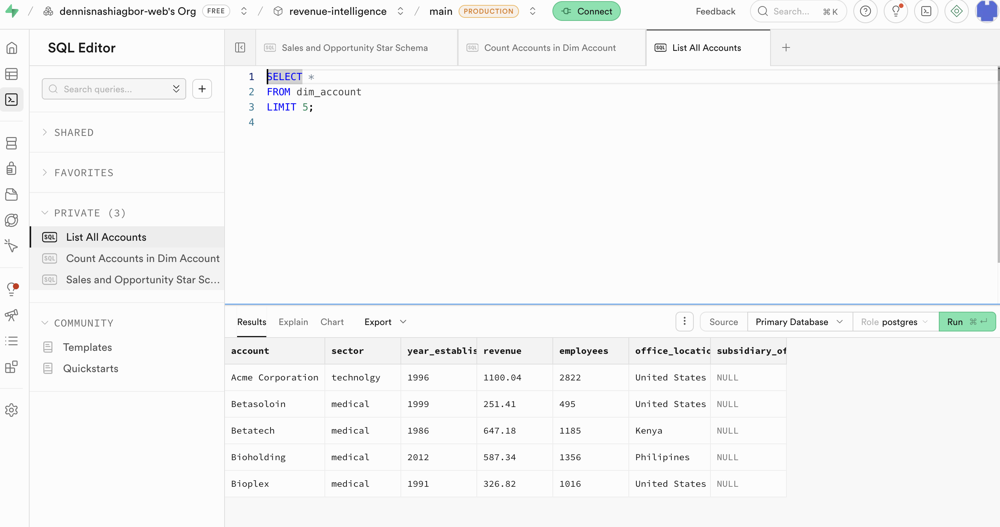

#### Preview products
```
SELECT *
FROM dim_product
LIMIT 5;
```
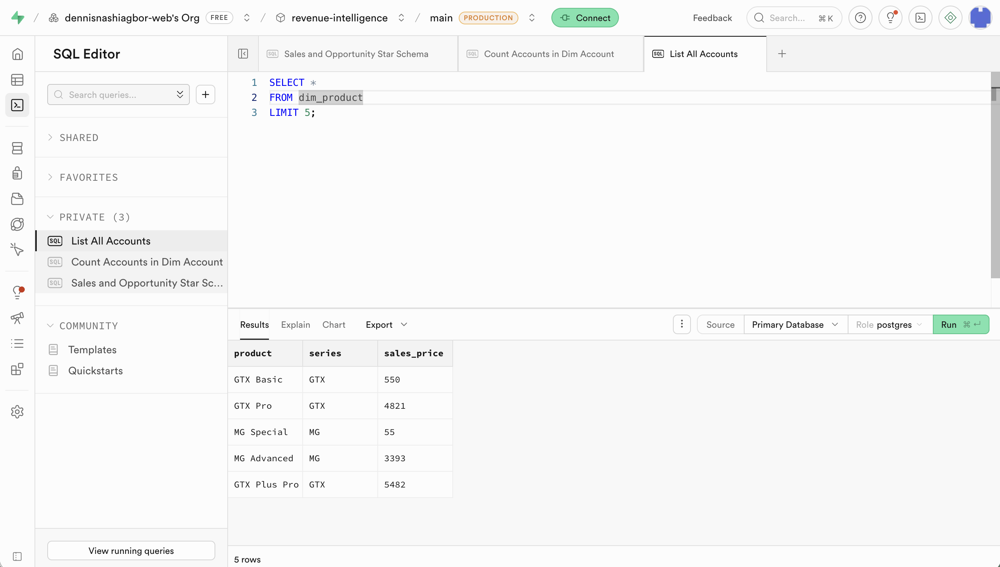

#### Preview sales agents
```
SELECT *
FROM dim_sales_agent
LIMIT 5;
```
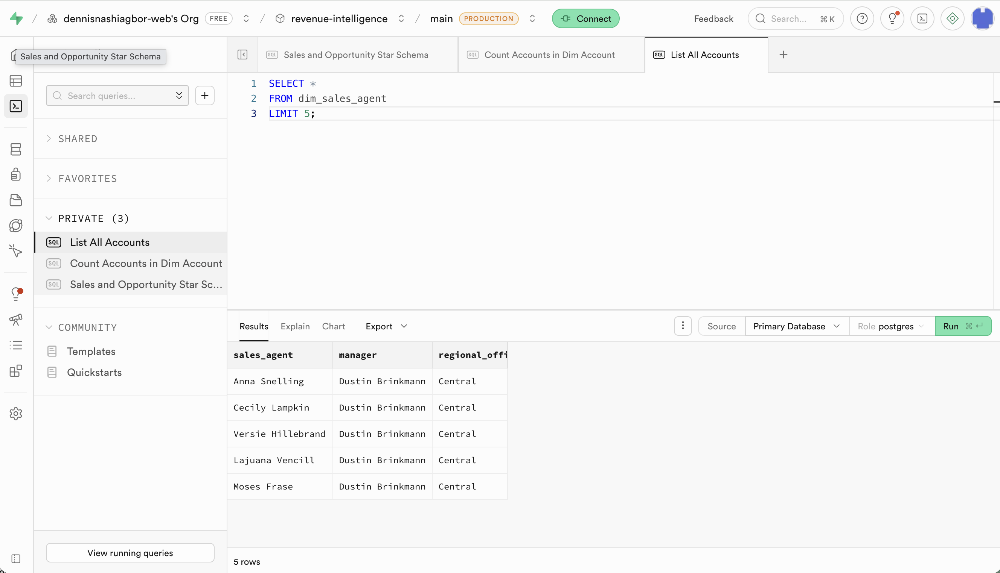

#### Preview opportunities
```
SELECT *
FROM fact_opportunity
LIMIT 5;
```
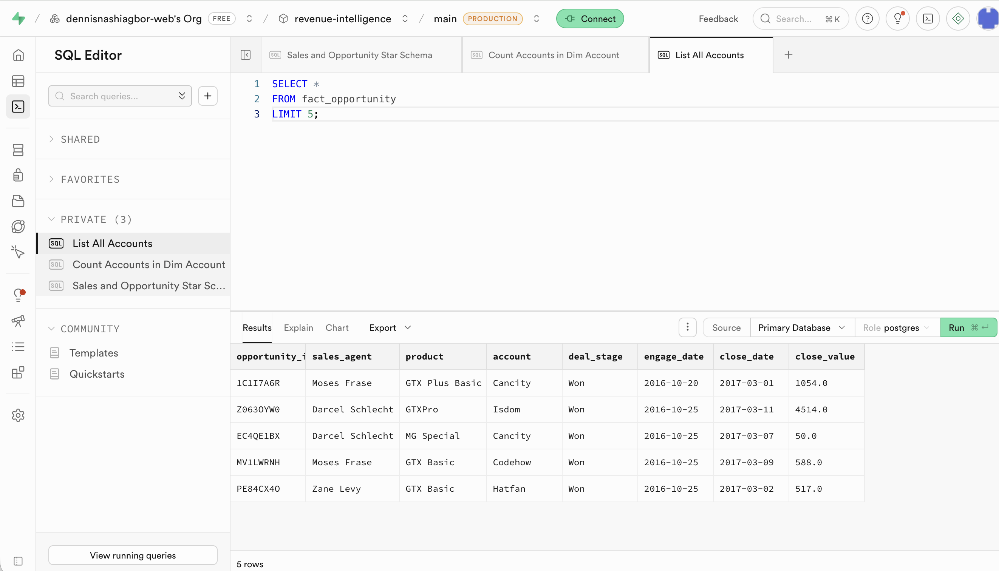

### Selecting specific columns
```
SELECT opportunity_id, account, product, deal_stage, close_value
FROM fact_opportunity
LIMIT 10;
```
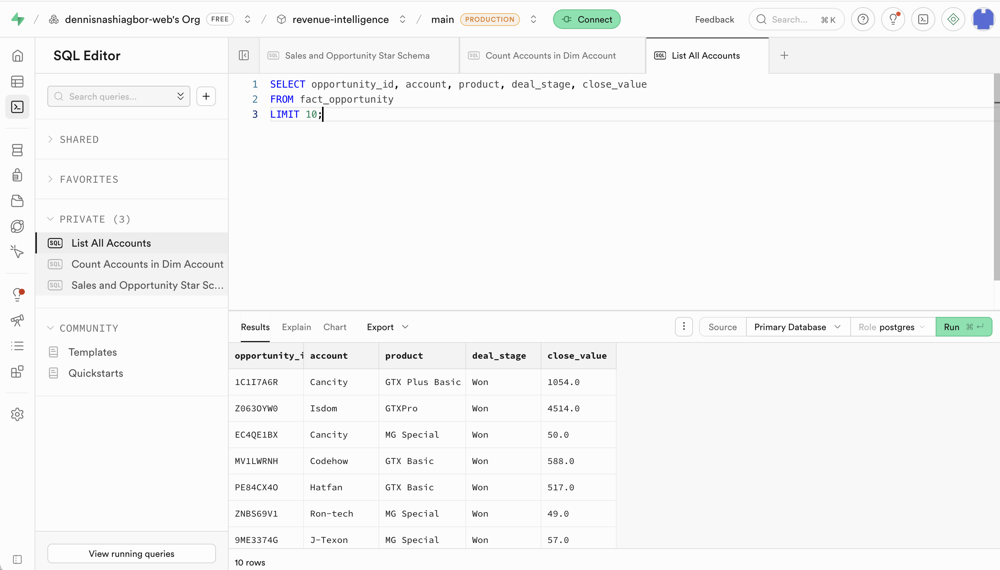

### Filtering rows with `WHERE`
```
SELECT opportunity_id, account, product, deal_stage, close_value
FROM fact_opportunity
WHERE deal_stage = 'Won'
LIMIT 10;
```
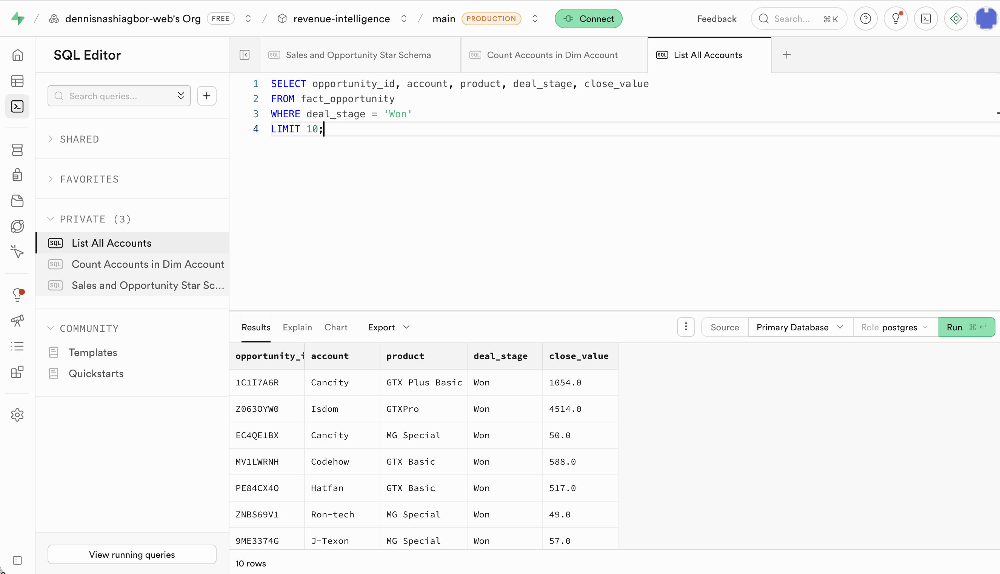

### Sorting results with `ORDER BY`
```
SELECT opportunity_id, account, product, close_value
FROM fact_opportunity
WHERE deal_stage = 'Won'
ORDER BY close_value DESC
LIMIT 10;
```
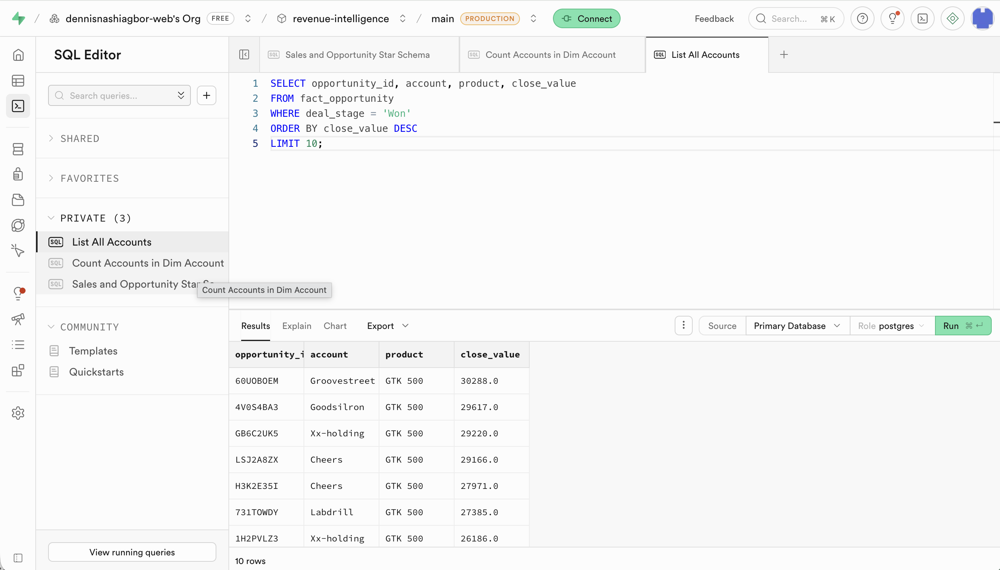

### Counting rows with `COUNT()`
Sample KPI questions:

How many total opportunities do we have?
```
SELECT COUNT(*) AS total_opportunities
FROM fact_opportunity;
```
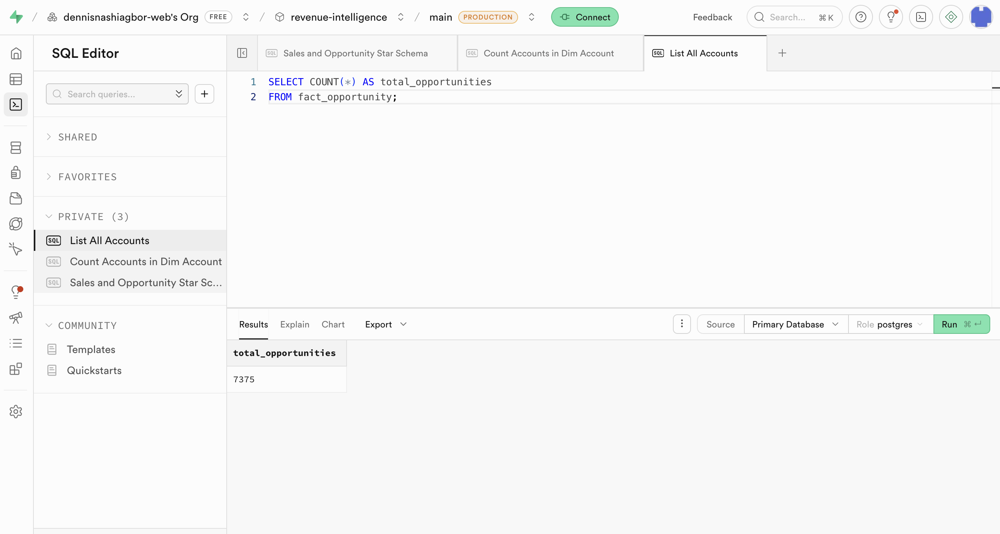

How many deals have we won?
```
SELECT COUNT(*) AS won_deals
FROM fact_opportunity
WHERE deal_stage = 'Won';
```
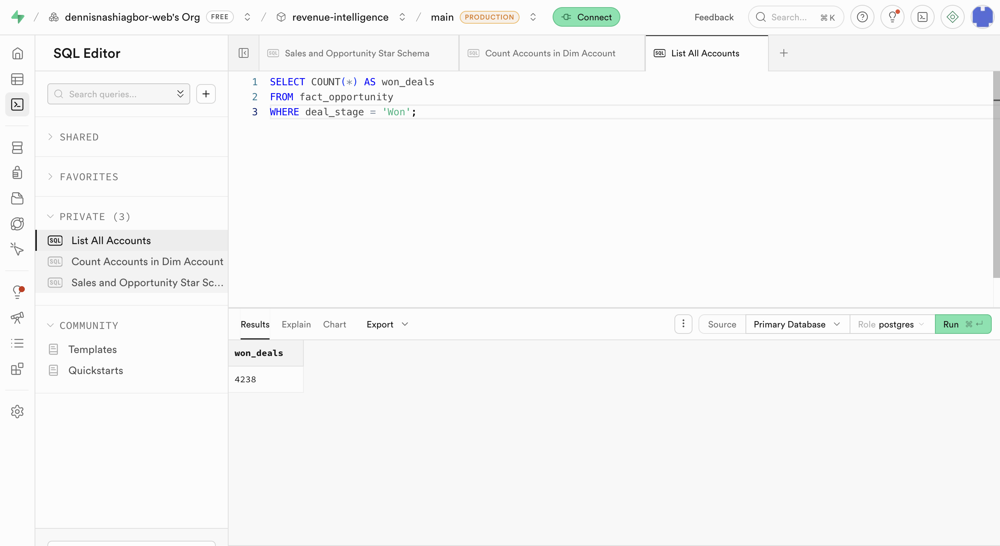

How many deals have we lost?
```
SELECT COUNT(*) AS lost_deals
FROM fact_opportunity
WHERE deal_stage = 'Lost';
```
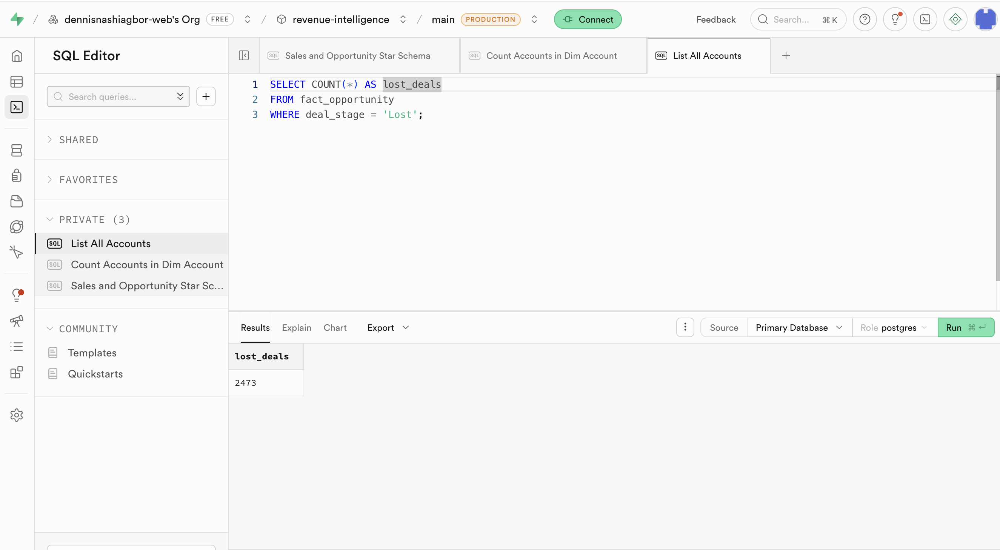

### Aggregating revenue with `SUM()`

```
SELECT SUM(close_value) AS total_won_revenue
FROM fact_opportunity
WHERE deal_stage = 'Won';
```
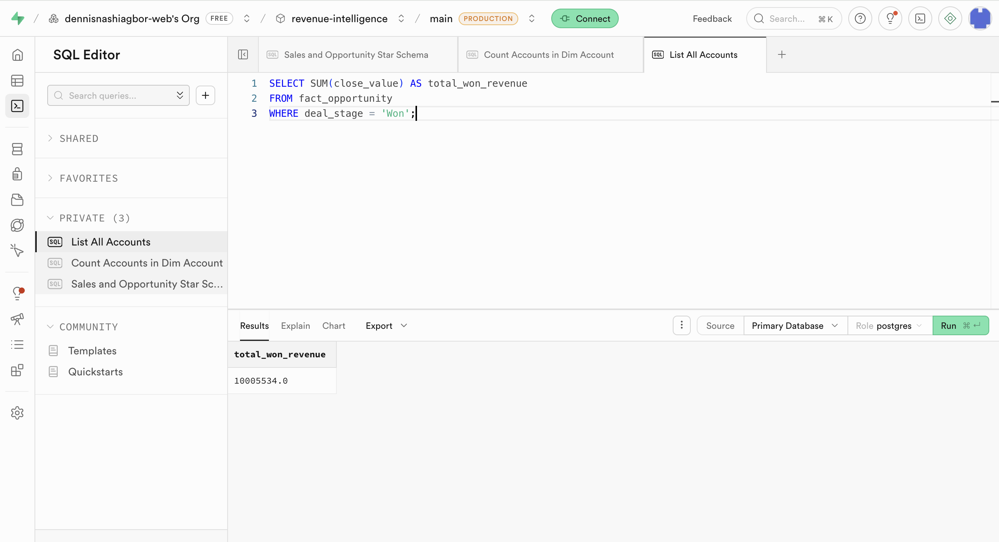

### Averaging deal size with `AVG()`

```
SELECT AVG(close_value) AS avg_won_deal_size
FROM fact_opportunity
WHERE deal_stage = 'Won';
```
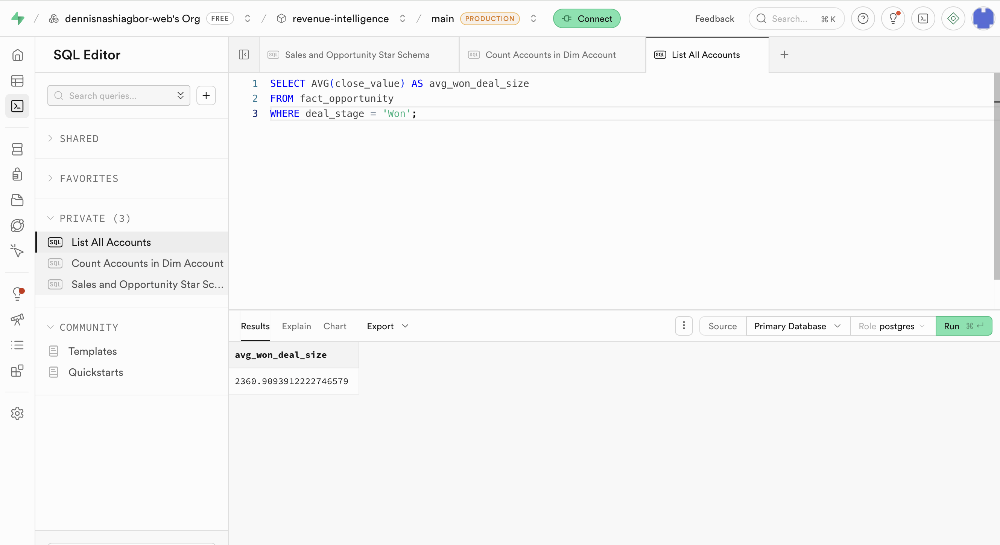

### Grouping by a category with `GROUP BY`

```
SELECT product, SUM(close_value) AS total_revenue
FROM fact_opportunity
WHERE deal_stage = 'Won'
GROUP BY product
ORDER BY total_revenue DESC;
```
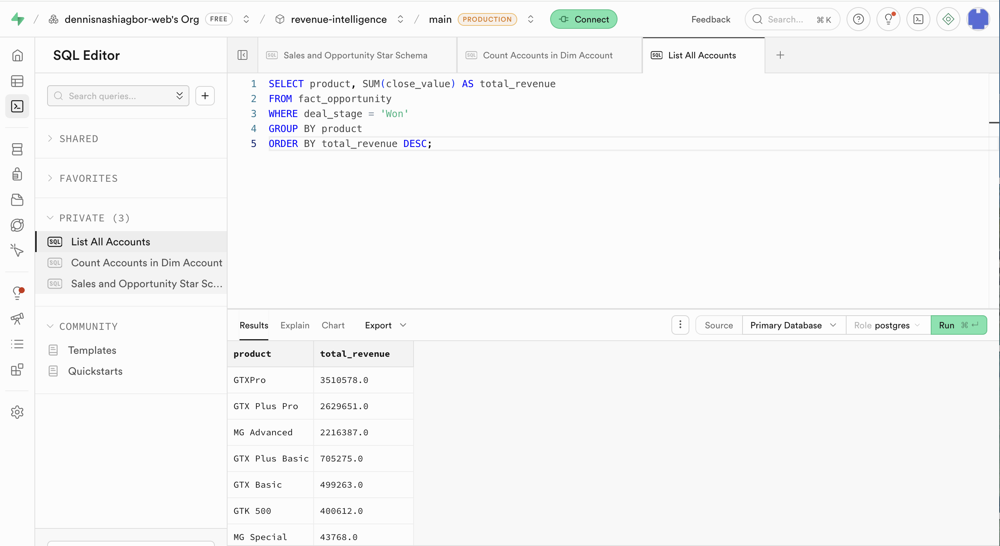

### Counting opportunities by deal stage

```
SELECT deal_stage, COUNT(*) AS num_opportunities
FROM fact_opportunity
GROUP BY deal_stage
ORDER BY num_opportunities DESC;
```
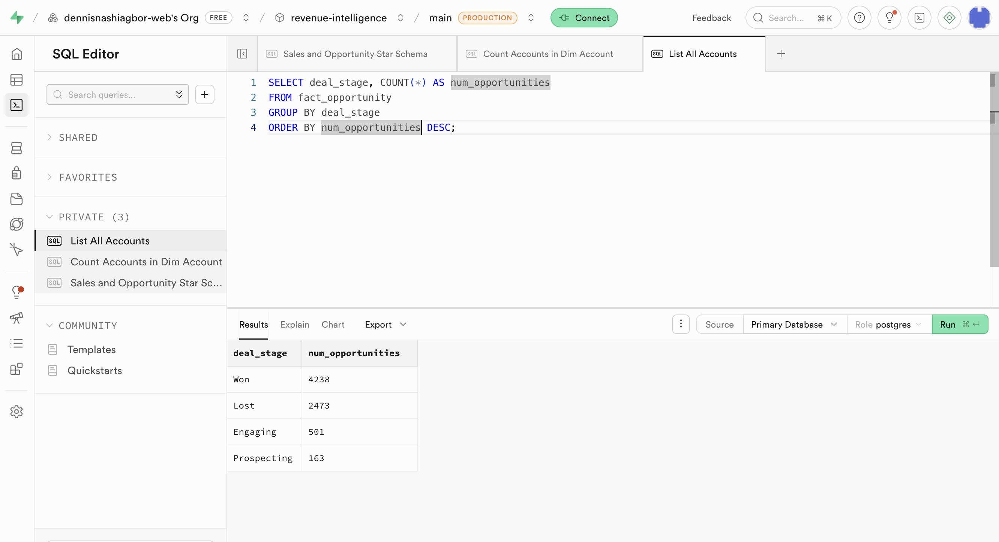

### Revenue by account

```
SELECT account, SUM(close_value) AS total_revenue
FROM fact_opportunity
WHERE deal_stage = 'Won'
GROUP BY account
ORDER BY total_revenue DESC
LIMIT 10;
```
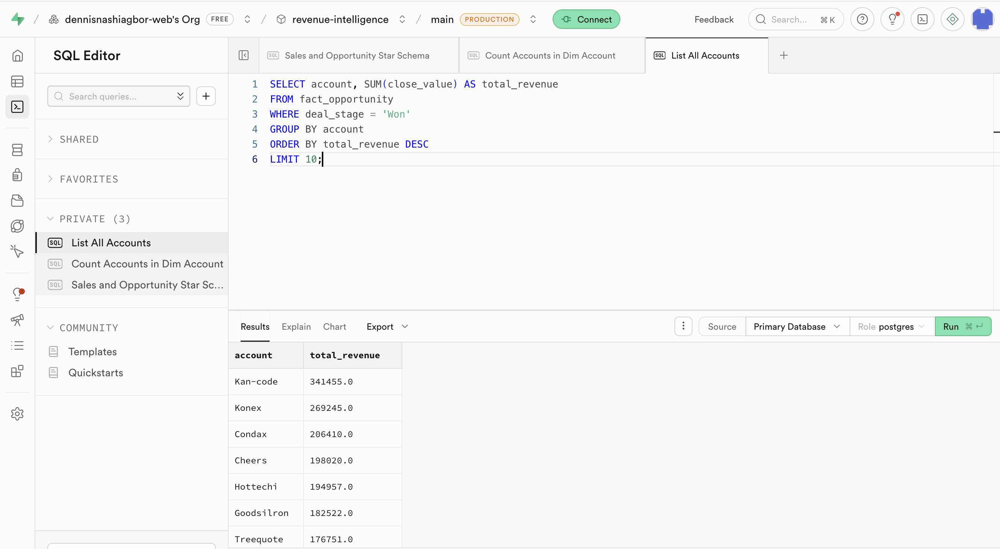

### Joining a fact table to a dimension table with `JOIN`

```
SELECT
    a.sector,
    SUM(f.close_value) AS total_revenue
FROM fact_opportunity f
JOIN dim_account a
    ON f.account = a.account
WHERE f.deal_stage = 'Won'
GROUP BY a.sector
ORDER BY total_revenue DESC;
```
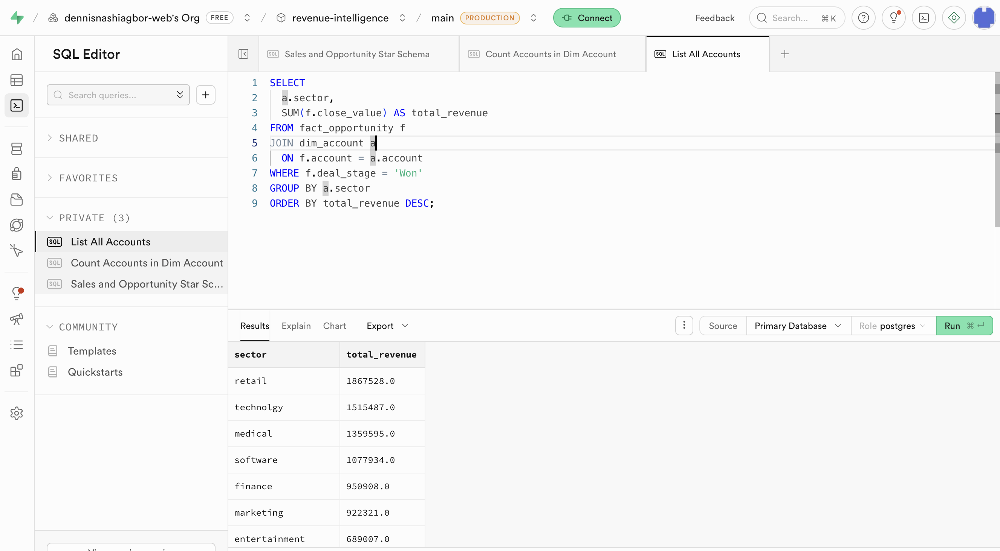

### Revenue by regional office

```
SELECT
    s.regional_office,
    SUM(f.close_value) AS total_revenue
FROM fact_opportunity f
JOIN dim_sales_agent s
    ON f.sales_agent = s.sales_agent
WHERE f.deal_stage = 'Won'
GROUP BY s.regional_office
ORDER BY total_revenue DESC;
```
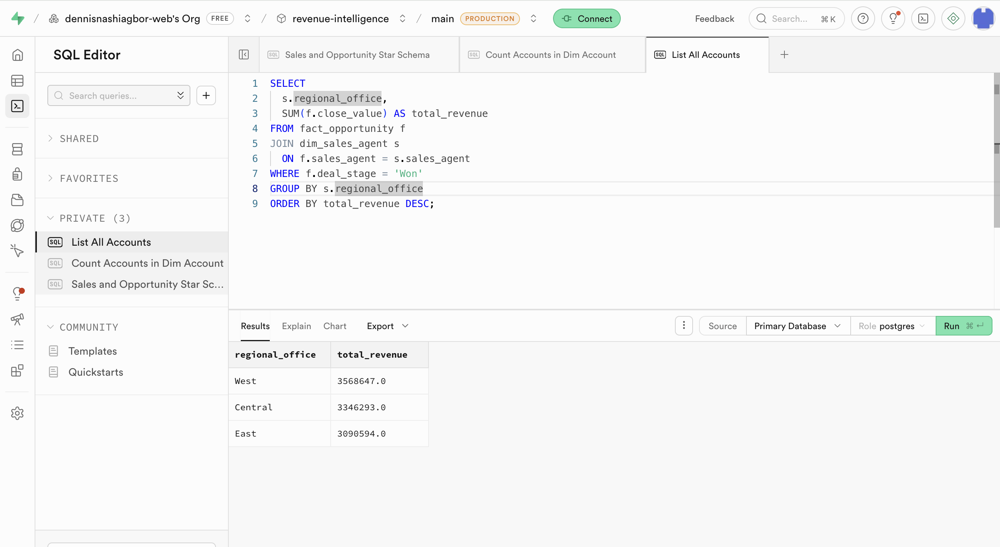

### Counting deals by sales agent

```
SELECT
    sales_agent,
    COUNT(*) AS total_deals
FROM fact_opportunity
GROUP BY sales_agent
ORDER BY total_deals DESC
LIMIT 10;
```
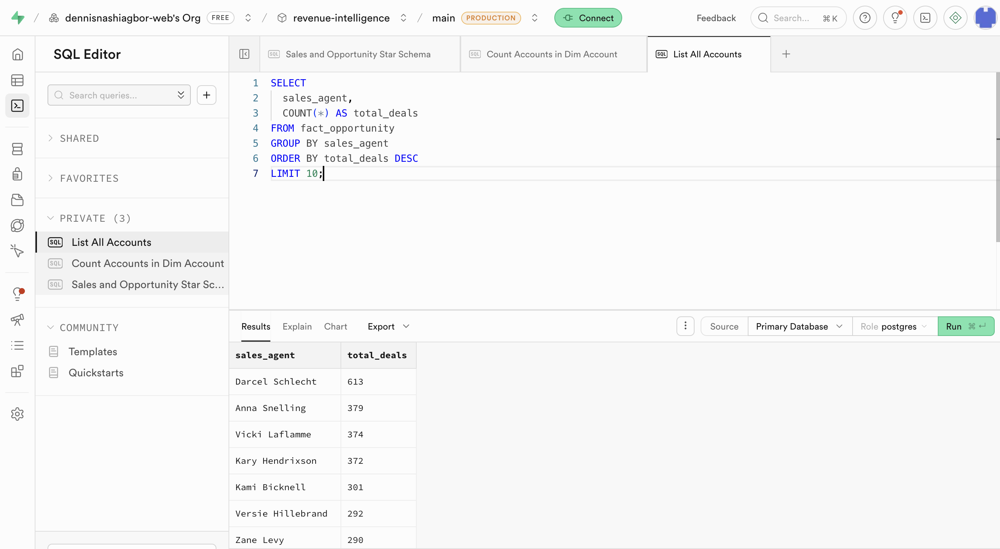

### Won deals by sales agent
```
SELECT
    sales_agent,
    COUNT(*) AS won_deals
FROM fact_opportunity
WHERE deal_stage = 'Won'
GROUP BY sales_agent
ORDER BY won_deals DESC
LIMIT 10;
```
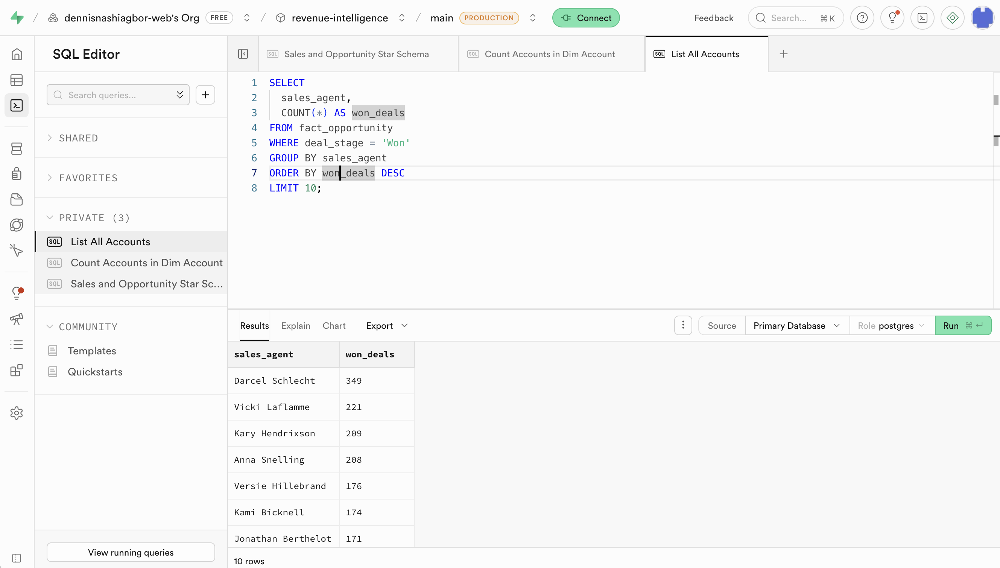

### Calculating win rate

```
SELECT
    COUNT(CASE WHEN deal_stage = 'Won' THEN 1 END) AS won_deals,
    COUNT(CASE WHEN deal_stage IN ('Won', 'Lost') THEN 1 END) AS closed_deals,
    ROUND(
        COUNT(CASE WHEN deal_stage = 'Won' THEN 1 END)::NUMERIC
        / NULLIF(COUNT(CASE WHEN deal_stage IN ('Won', 'Lost') THEN 1 END), 0),
        4
    ) AS win_rate
FROM fact_opportunity;
```
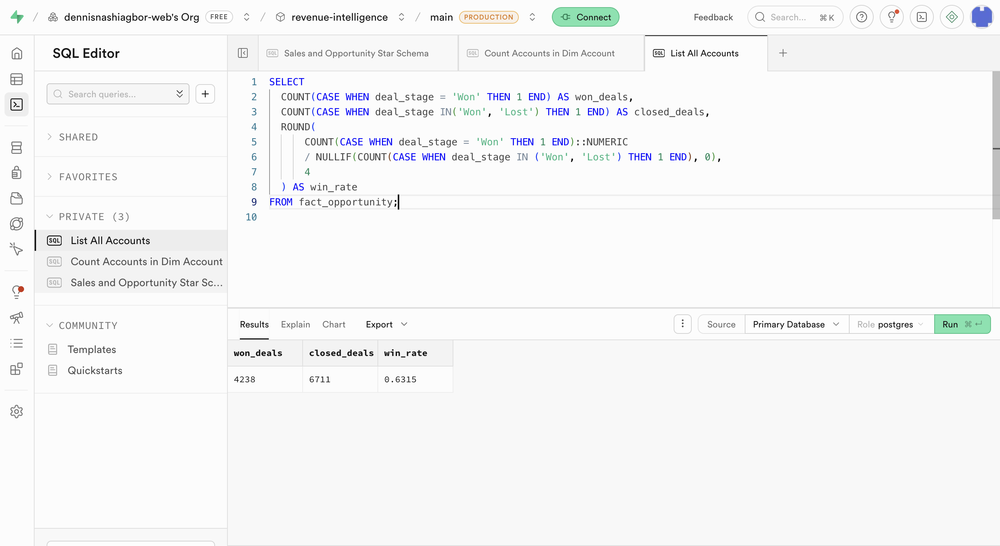

### Calculating open pipeline value

```
SELECT SUM(close_value) AS open_pipeline_value
FROM fact_opportunity
WHERE deal_stage IN ('Prospecting', 'Engaging');
```
Close value returns null because the `Prospecting` and `Engaging` stage all have no values.

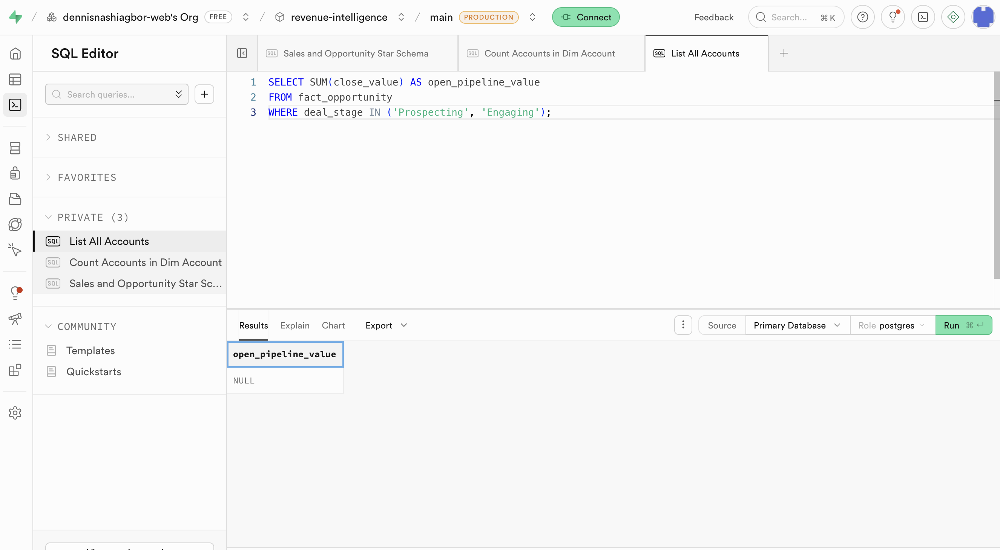

## Date-based SQL, Monthly Revenue Trends, and Window Functions

### Previewing the date columns

```
SELECT
    opportunity_id,
    deal_stage,
    engage_date,
    close_date,
    close_value
FROM fact_opportunity
LIMIT 10;
```
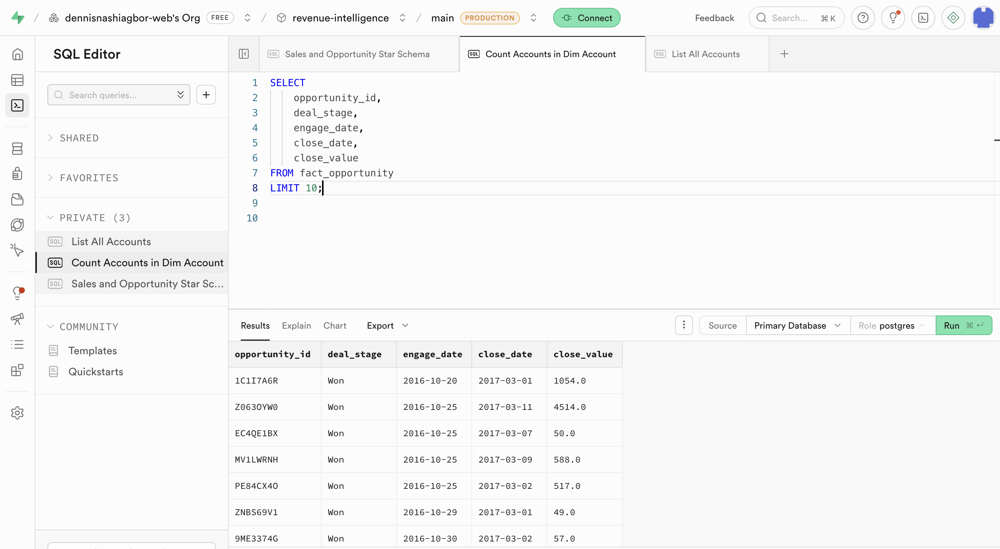

### Monthly won revenue
```
SELECT
    opportunity_id,
    deal_stage,
    engage_date,
    close_date,
    close_value
FROM fact_opportunity
LIMIT 10;
```
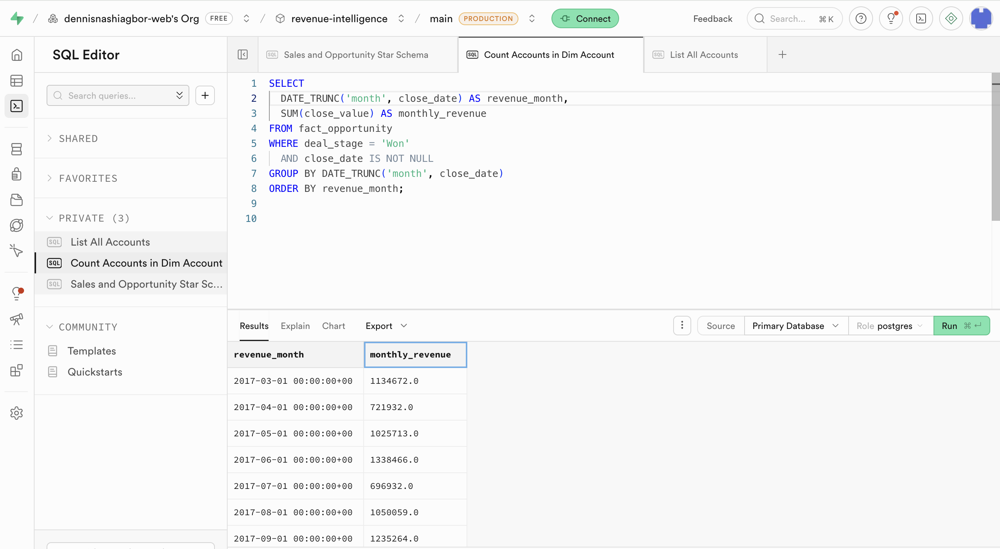

### Monthly won deal count
```
SELECT
    DATE_TRUNC('month', close_date) AS revenue_month,
    COUNT(*) AS won_deals
FROM fact_opportunity
WHERE deal_stage = 'Won'
  AND close_date IS NOT NULL
GROUP BY DATE_TRUNC('month', close_date)
ORDER BY revenue_month;
```
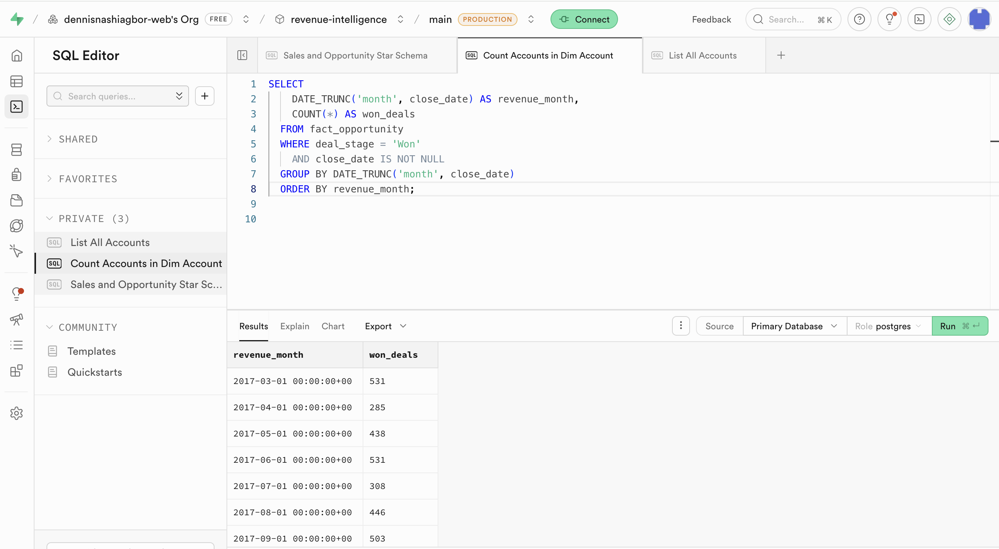

### Average won deal size by month
```
SELECT
    DATE_TRUNC('month', close_date) AS revenue_month,
    AVG(close_value) AS avg_deal_size
FROM fact_opportunity
WHERE deal_stage = 'Won'
  AND close_date IS NOT NULL
GROUP BY DATE_TRUNC('month', close_date)
ORDER BY revenue_month;
```
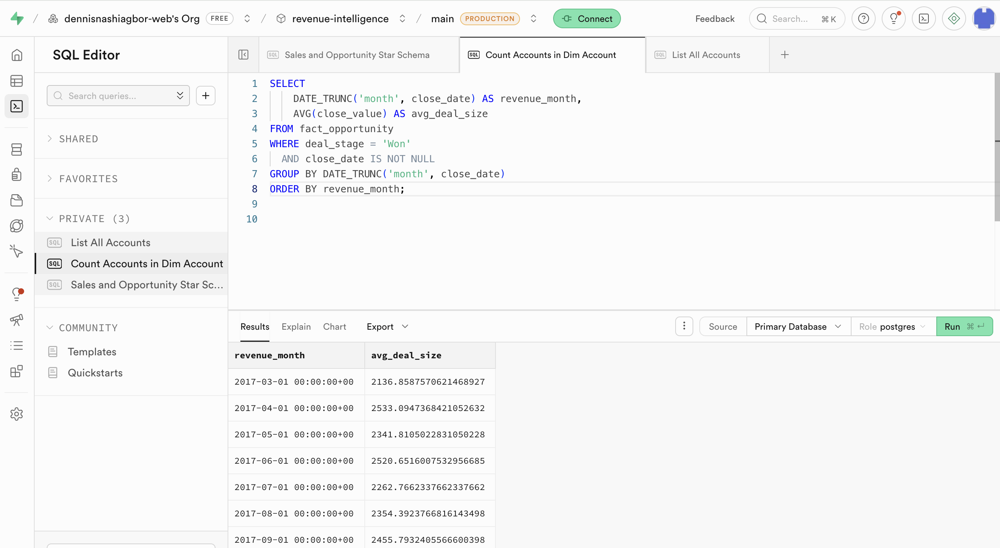

### Monthly opportunities created
```
SELECT
    DATE_TRUNC('month', engage_date) AS engage_month,
    COUNT(*) AS opportunities_created
FROM fact_opportunity
WHERE engage_date IS NOT NULL
GROUP BY DATE_TRUNC('month', engage_date)
ORDER BY engage_month;
```
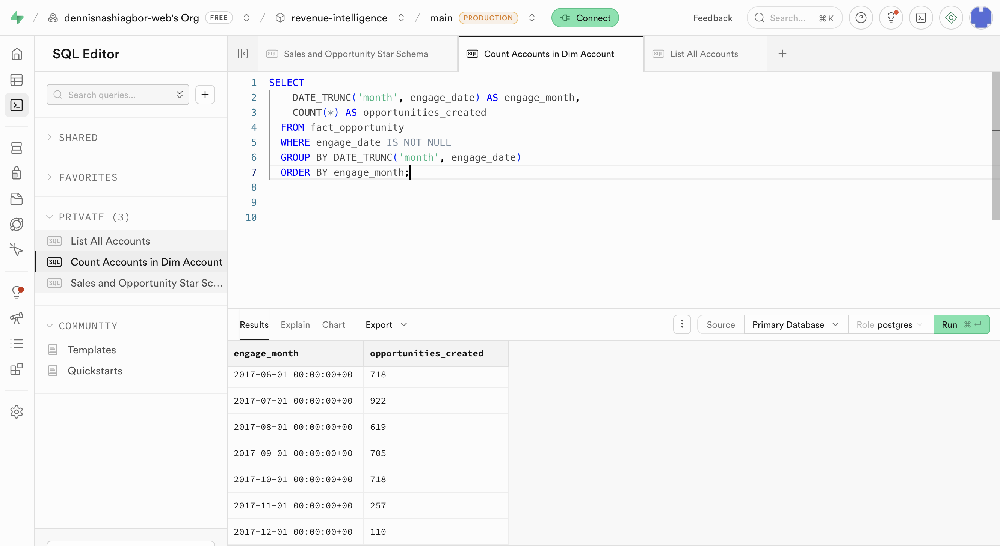

### Window function: running total revenue
```
SELECT
    revenue_month,
    monthly_revenue,
    SUM(monthly_revenue) OVER (ORDER BY revenue_month) AS running_total_revenue
FROM (
    SELECT
        DATE_TRUNC('month', close_date) AS revenue_month,
        SUM(close_value) AS monthly_revenue
    FROM fact_opportunity
    WHERE deal_stage = 'Won'
      AND close_date IS NOT NULL
    GROUP BY DATE_TRUNC('month', close_date)
) t
ORDER BY revenue_month;
```
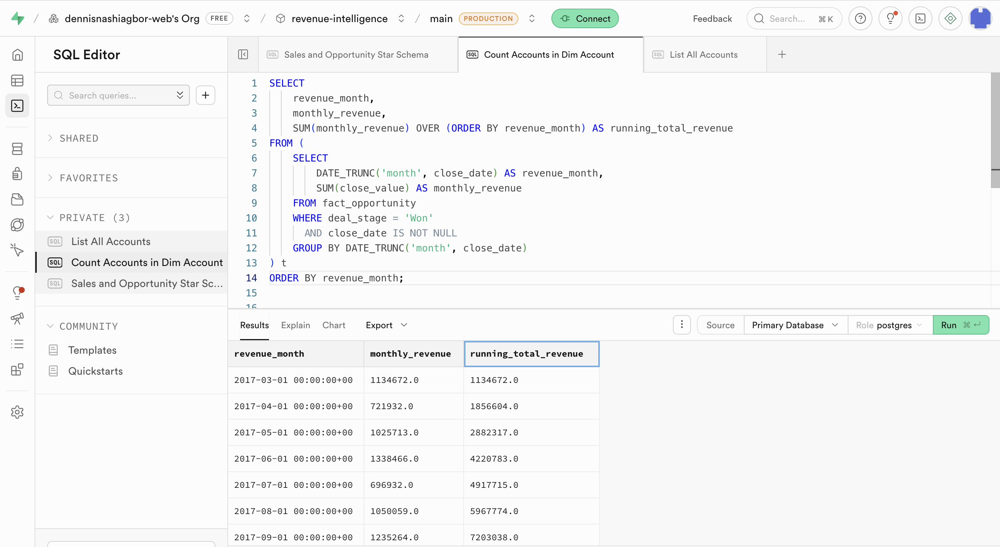

### Window function: previous month revenue with `LAG()`
```
SELECT
    revenue_month,
    monthly_revenue,
    LAG(monthly_revenue) OVER (ORDER BY revenue_month) AS prior_month_revenue
FROM (
    SELECT
        DATE_TRUNC('month', close_date) AS revenue_month,
        SUM(close_value) AS monthly_revenue
    FROM fact_opportunity
    WHERE deal_stage = 'Won'
      AND close_date IS NOT NULL
    GROUP BY DATE_TRUNC('month', close_date)
) t
ORDER BY revenue_month;
```
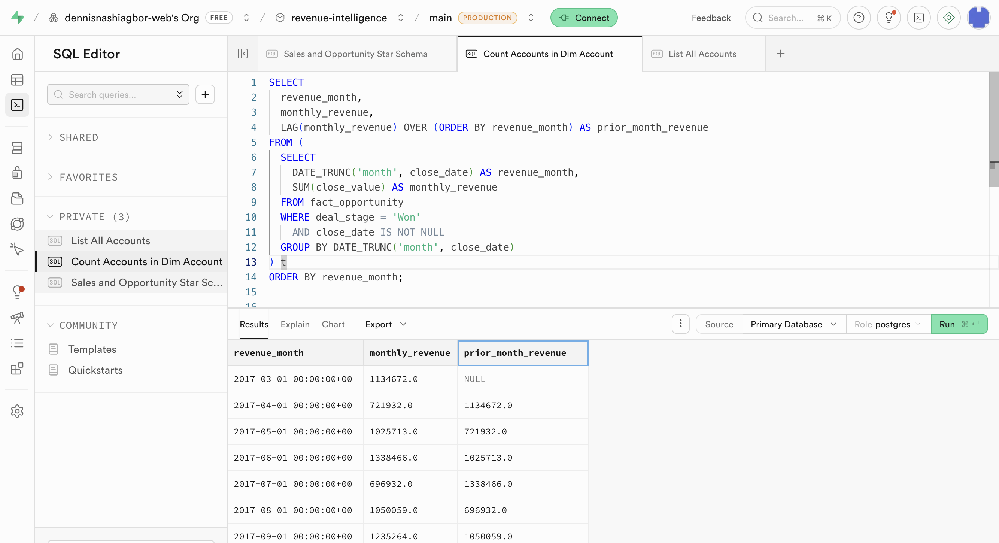

### Month-over-month revenue change
```
SELECT
    revenue_month,
    monthly_revenue,
    LAG(monthly_revenue) OVER (ORDER BY revenue_month) AS prior_month_revenue,
    monthly_revenue
        - LAG(monthly_revenue) OVER (ORDER BY revenue_month) AS mom_revenue_change
FROM (
    SELECT
        DATE_TRUNC('month', close_date) AS revenue_month,
        SUM(close_value) AS monthly_revenue
    FROM fact_opportunity
    WHERE deal_stage = 'Won'
      AND close_date IS NOT NULL
    GROUP BY DATE_TRUNC('month', close_date)
) t
ORDER BY revenue_month;
```
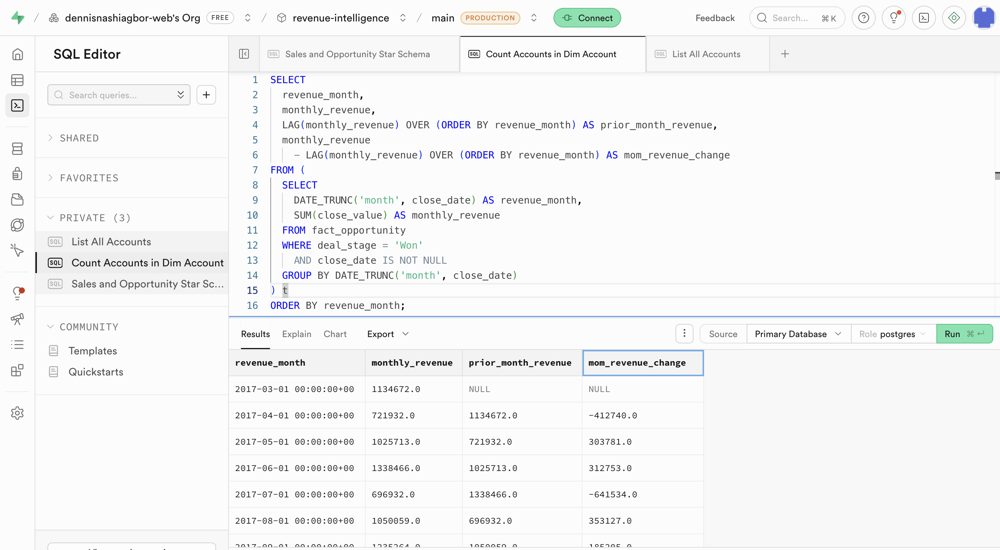

### Month-over-month revenue growth rate
```
SELECT
    revenue_month,
    monthly_revenue,
    LAG(monthly_revenue) OVER (ORDER BY revenue_month) AS prior_month_revenue,
    ROUND(
        (
            monthly_revenue
            - LAG(monthly_revenue) OVER (ORDER BY revenue_month)
        ) / NULLIF(LAG(monthly_revenue) OVER (ORDER BY revenue_month), 0),
        4
    ) AS mom_growth_rate
FROM (
    SELECT
        DATE_TRUNC('month', close_date) AS revenue_month,
        SUM(close_value) AS monthly_revenue
    FROM fact_opportunity
    WHERE deal_stage = 'Won'
      AND close_date IS NOT NULL
    GROUP BY DATE_TRUNC('month', close_date)
) t
ORDER BY revenue_month;
```
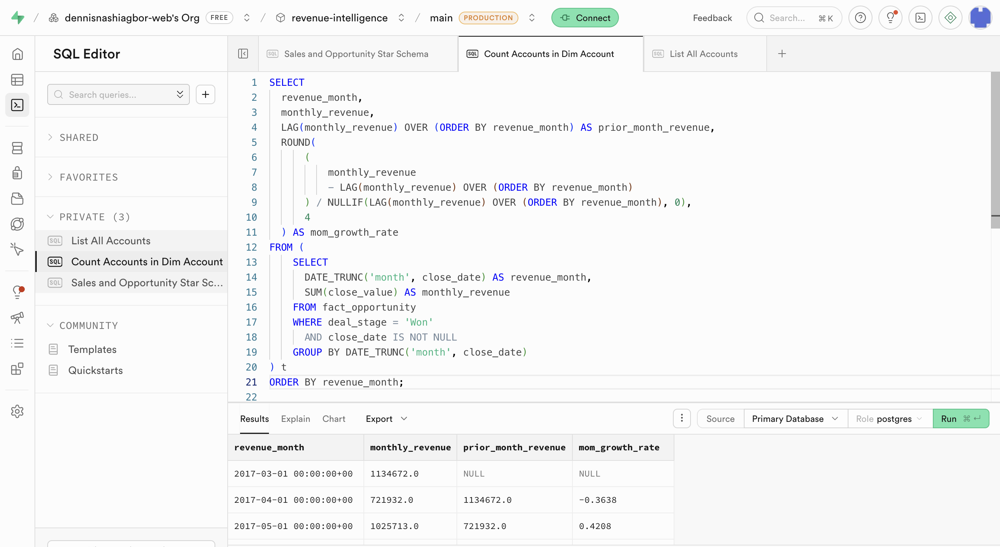

### Monthly won revenue by product
```
SELECT
    DATE_TRUNC('month', close_date) AS revenue_month,
    product,
    SUM(close_value) AS monthly_revenue
FROM fact_opportunity
WHERE deal_stage = 'Won'
  AND close_date IS NOT NULL
GROUP BY DATE_TRUNC('month', close_date), product
ORDER BY revenue_month, monthly_revenue DESC;
```
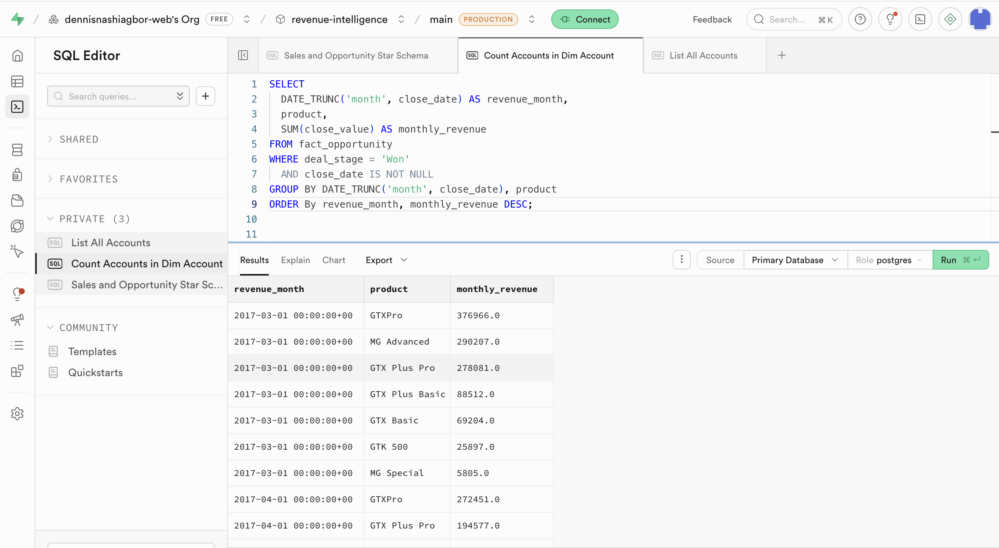

### Monthly won revenue by sector
```
SELECT
    DATE_TRUNC('month', f.close_date) AS revenue_month,
    a.sector,
    SUM(f.close_value) AS monthly_revenue
FROM fact_opportunity f
JOIN dim_account a
    ON f.account = a.account
WHERE f.deal_stage = 'Won'
  AND f.close_date IS NOT NULL
GROUP BY DATE_TRUNC('month', f.close_date), a.sector
ORDER BY revenue_month, monthly_revenue DESC;
```
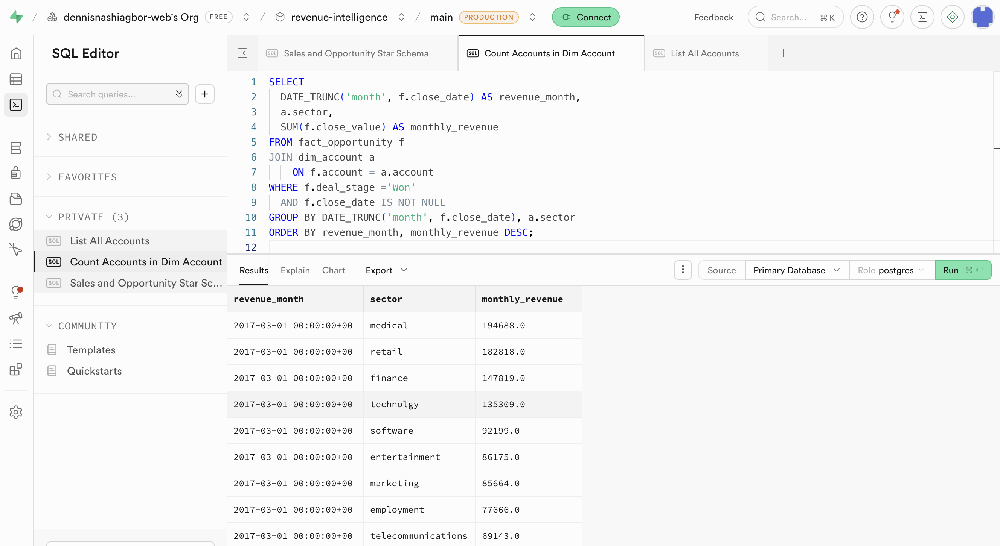

## Sales Cycle Analysis, Funnel SQL, and Advanced Business KPIs

### Sales cycle length (days)

```
SELECT
    opportunity_id,
    account,
    sales_agent,
    engage_date,
    close_date,
    (close_date - engage_date) AS sales_cycle_days
FROM fact_opportunity
WHERE deal_stage = 'Won'
  AND engage_date IS NOT NULL
  AND close_date IS NOT NULL
LIMIT 25;
```
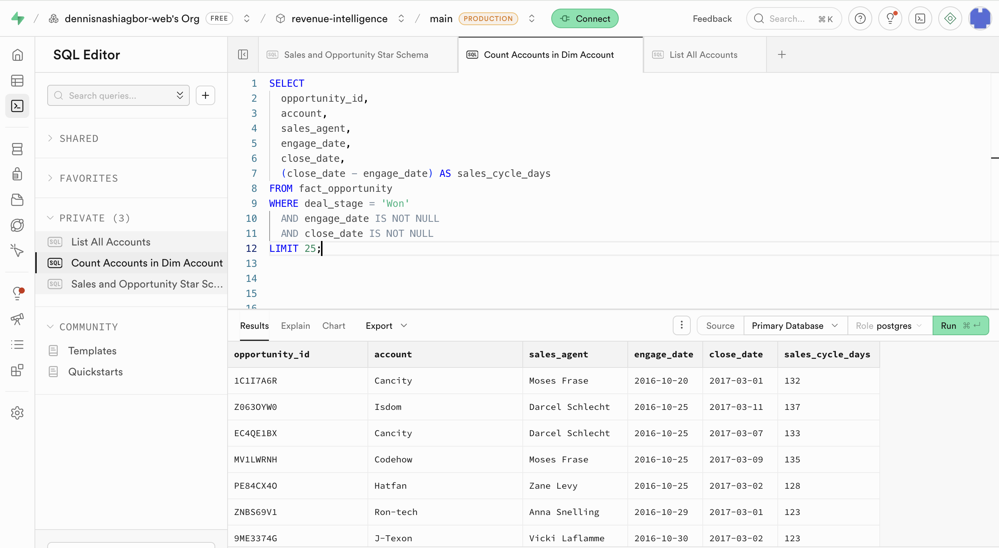

### Average sales cycle length
```
SELECT
    ROUND(AVG(close_date - engage_date), 2) AS avg_sales_cycle_days
FROM fact_opportunity
WHERE deal_stage = 'Won'
  AND engage_date IS NOT NULL
  AND close_date IS NOT NULL;
  ```
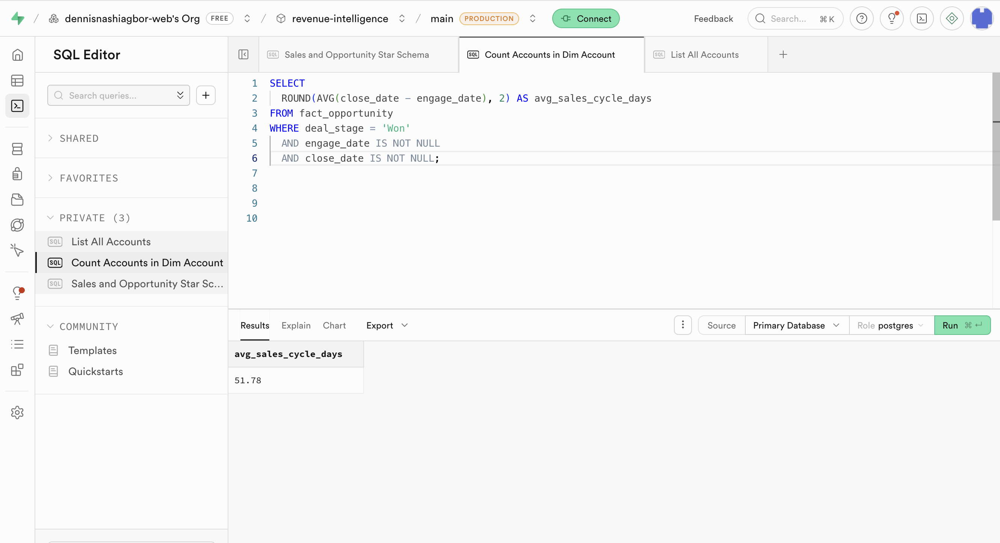

### Average sales cycle by product
```
SELECT
    product,
    ROUND(AVG(close_date - engage_date), 2) AS avg_sales_cycle_days
FROM fact_opportunity
WHERE deal_stage = 'Won'
  AND engage_date IS NOT NULL
  AND close_date IS NOT NULL
GROUP BY product
ORDER BY avg_sales_cycle_days DESC;
```
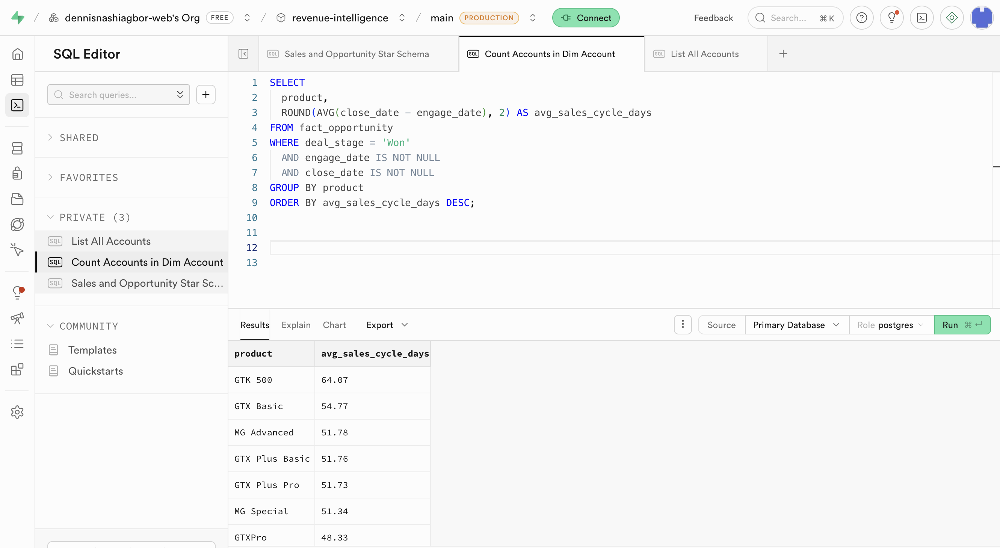

### Average sales cycle by rep
```
SELECT
    sales_agent,
    ROUND(AVG(close_date - engage_date), 2) AS avg_sales_cycle_days
FROM fact_opportunity
WHERE deal_stage = 'Won'
  AND engage_date IS NOT NULL
  AND close_date IS NOT NULL
GROUP BY sales_agent
ORDER BY avg_sales_cycle_days ASC
LIMIT 10;
```
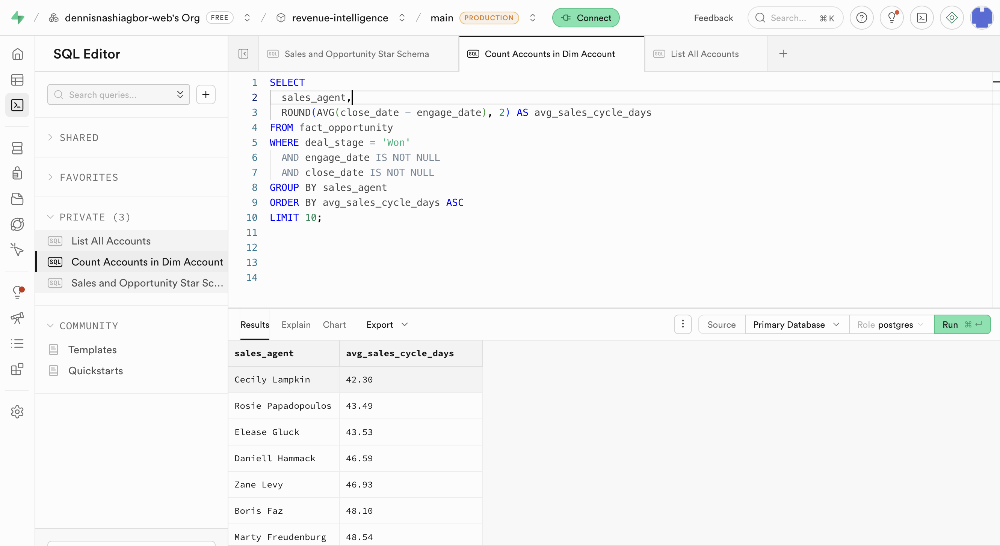

### Funnel conversion counts
```
SELECT
    deal_stage,
    COUNT(*) AS deals
FROM fact_opportunity
GROUP BY deal_stage
ORDER BY deals DESC;
```
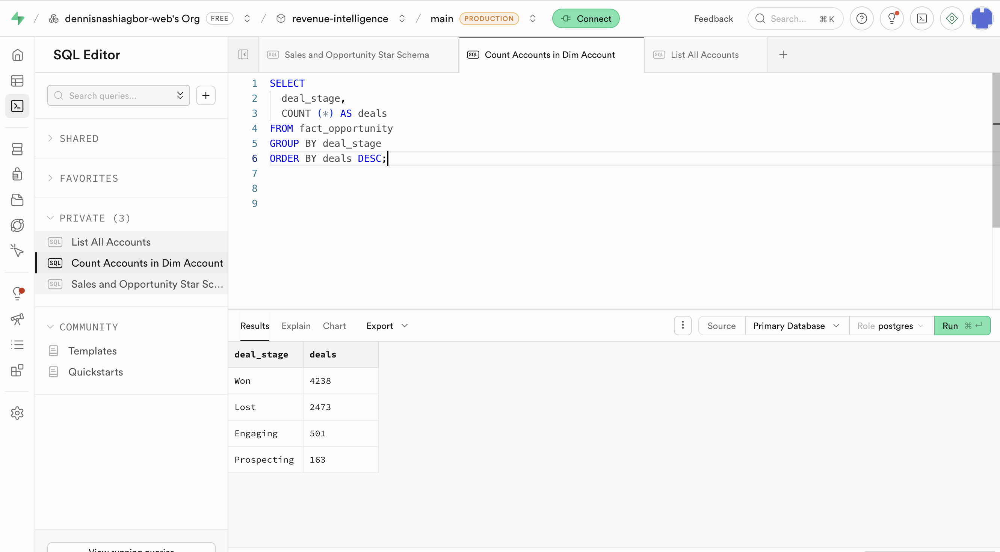

### Closed deal win rate by rep
```
SELECT
    sales_agent,
    COUNT(CASE WHEN deal_stage = 'Won' THEN 1 END) AS won_deals,
    COUNT(CASE WHEN deal_stage IN ('Won', 'Lost') THEN 1 END) AS closed_deals,
    ROUND(
        COUNT(CASE WHEN deal_stage = 'Won' THEN 1 END)::NUMERIC
        /
        NULLIF(
            COUNT(CASE WHEN deal_stage IN ('Won', 'Lost') THEN 1 END),
            0
        ),
        4
    ) AS win_rate
FROM fact_opportunity
GROUP BY sales_agent
ORDER BY win_rate DESC;
```
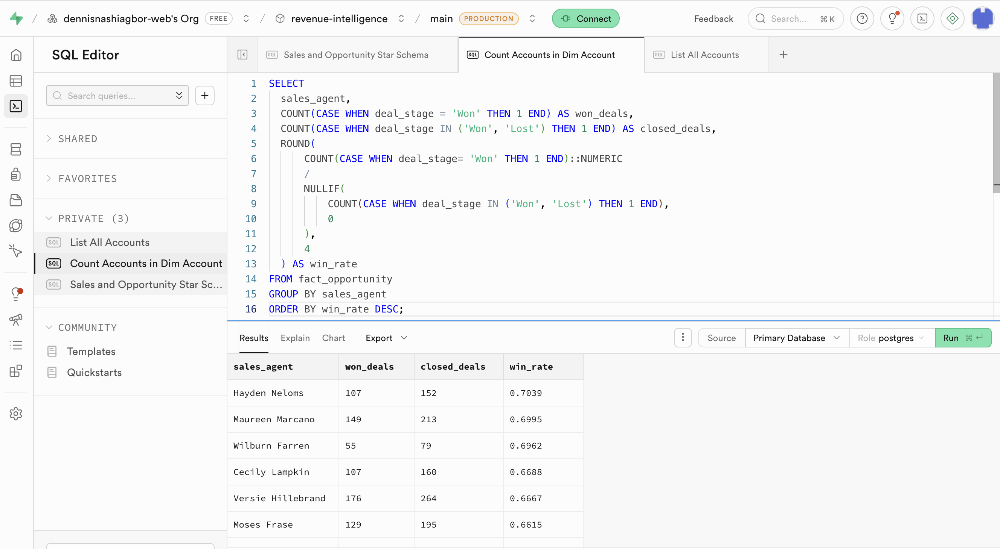

### Revenue by rep
```
SELECT
    sales_agent,
    SUM(close_value) AS won_revenue
FROM fact_opportunity
WHERE deal_stage = 'Won'
GROUP BY sales_agent
ORDER BY won_revenue DESC
LIMIT 10;
```
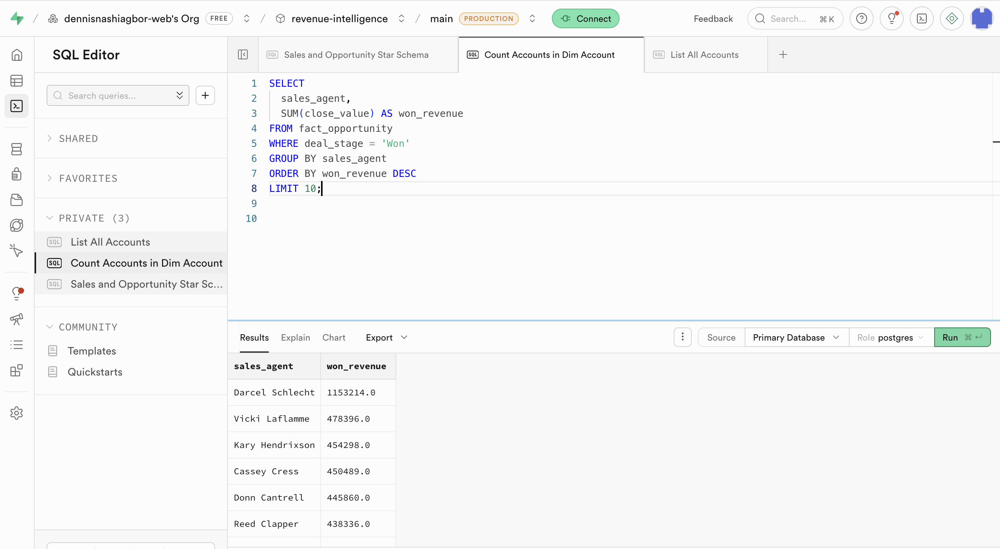

### Revenue per won deal (rep efficiency)
```
SELECT
    sales_agent,
    ROUND(AVG(close_value), 2) AS avg_won_deal_value
FROM fact_opportunity
WHERE deal_stage = 'Won'
GROUP BY sales_agent
ORDER BY avg_won_deal_value DESC;
```
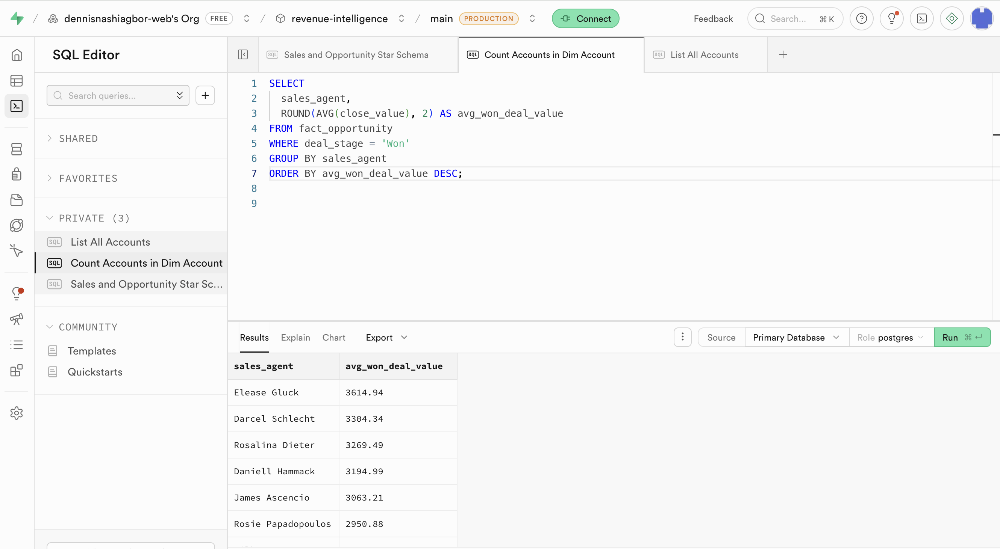

### Sector win rate
```
SELECT
    a.sector,
    COUNT(CASE WHEN f.deal_stage = 'Won' THEN 1 END) AS won_deals,
    COUNT(CASE WHEN f.deal_stage IN ('Won', 'Lost') THEN 1 END) AS closed_deals,
    ROUND(
        COUNT(CASE WHEN f.deal_stage = 'Won' THEN 1 END)::NUMERIC
        /
        NULLIF(
            COUNT(CASE WHEN f.deal_stage IN ('Won', 'Lost') THEN 1 END),
            0
        ),
        4
    ) AS win_rate
FROM fact_opportunity f
JOIN dim_account a
    ON f.account = a.account
GROUP BY a.sector
ORDER BY win_rate DESC;
```
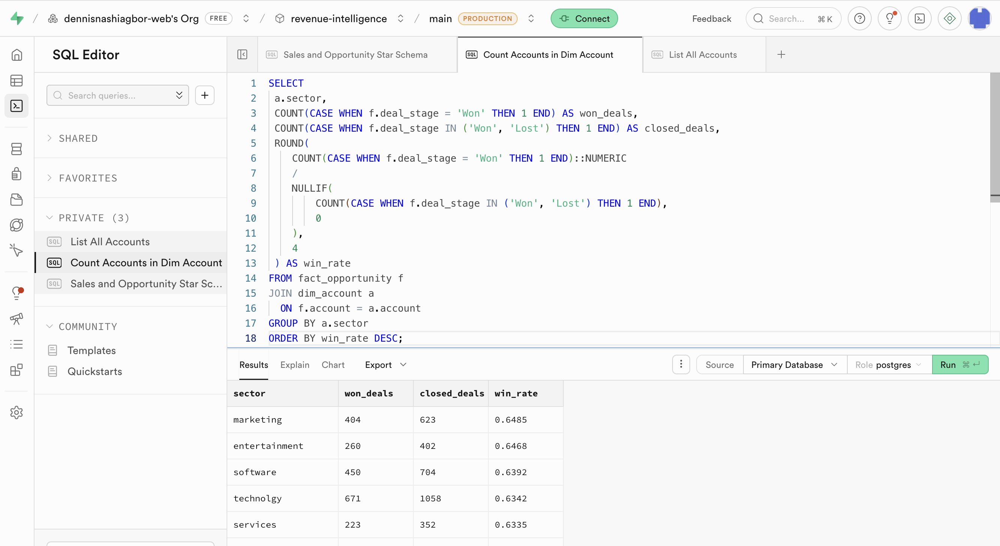

### Large deal analysis
```
SELECT
    COUNT(*) AS large_deals,
    SUM(close_value) AS large_deal_revenue
FROM fact_opportunity
WHERE deal_stage = 'Won'
  AND close_value >= 10000;
```
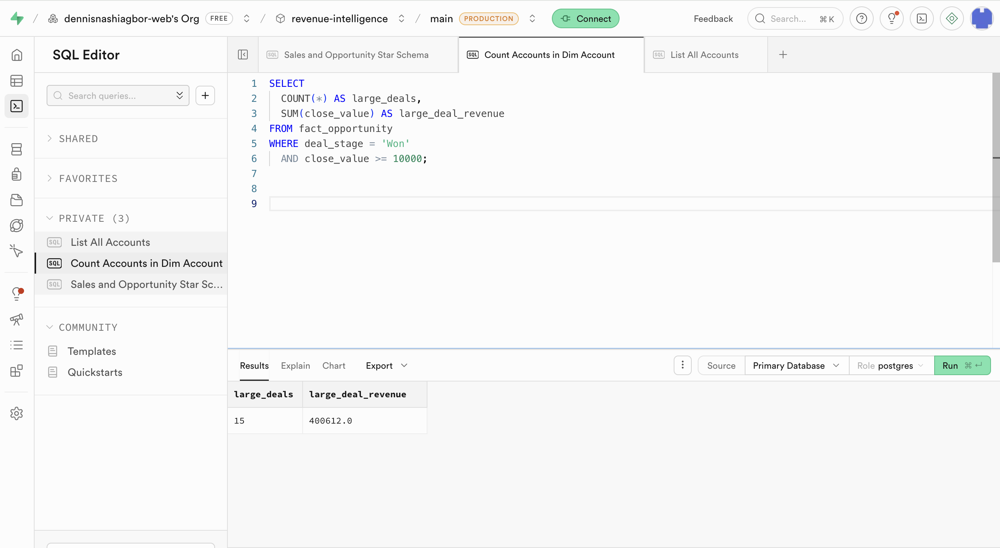